# <div class="alert alert-block alert-info">  Boosting Algorithms </div> 

## Table of Contents
* [Extreme Gradient Boosting](#Extreme_gradient_boosting)
    * [Why is XGBoost so known?](#why_xgboost_known)
    * [Hyperparameters](#hyperparameters)
    * [Booster Parameters](#booster_parameters)
* [Import necessary libraries](#Import_necessary_libraries)
* [Data loading](#Data_loading)
* [Data preprocessing](#Data_preprocessing)
* [Data Cleaning](#Data_cleaning)
* [Data Visualization](#Data_Visualization)
    * [Univariate Analysis](#univariate_analysis)
* [Encoding the categorical variables](#encoding)
* [Automated EDA](#Automated_EDA)
    * [Dataprep](#dataprep)
    * [Pandas-profiling](#pandas_profiling)
    * [Sweetviz](#sweetviz)
* [Feature Engineering](#Feature_Engineering)
    * [Correlation](#correlation)
    * [Feature Scaling](#Feature_Scaling)
    * [Feature Importance](#Feature_Importance)
        * [Using Decision Tree](#decision_tree)
        * [Using Random Forest](#random_forest)
* [Model Building](#Model_Building)
* [Evaluation metrics](#Evaluation_metrics)
* [Decision boundaries](#Decision_boundaries)
* [Hyperparameter Tuning](#Hyperparameter_Tuning)

## <div class="alert alert-block alert-warning"> Extreme Gradient Boosting (XGBoost)</div>  <a class="anchor" id="Extreme_gradient_boosting"></a>

 <code style="background:orange;color:black">XGBoost is one of the most popular machine learning algorithm regardless of the type of prediction; regression or classification.</code>

## Why is XGBoost is so known? 
- Speed and performance : It is comparatively faster than other ensemble classifiers.
- Core algorithm is parallelizable : Because the core XGBoost algorithm is parallelizable it can harness the power of multi-core computers. It is also parallelizable onto GPU’s and across networks of computers making it feasible to train on very large datasets as well.
- Consistently outperforms other algorithm methods : It has shown better performance on a variety of machine learning benchmark datasets.
- Wide variety of tuning parameters : XGBoost internally has parameters for 
1. **CROSS-VALIDATION**
2. **REGULARIZATION**
3. **USER-DEFINED OBJECTIVE FUNCTIONS**
4. **MISSING VALUES**
5. **TREE PARAMETERS** <br>
It also has **compatible API'S with scikit-learn**

**`XGBoost (Extreme Gradient Boosting) belongs to a family of boosting algorithms and uses the gradient boosting (GBM) framework at its core. It is an optimized distributed gradient boosting library`**

- That's the basic idea behind boosting algorithms is building a weak model, making conclusions about the various feature importance and parameters, and then using those conclusions to build a new, stronger model
- Then, capitalize on the misclassification error of the previous model and try to reduce it. 

### <mark> Hyperparameters of XGBoost </mark>

- **n_estimators:** specifies the **number of decision trees** to be boosted. If n_estimator = 1, it means only 1 tree is generated, thus no boosting is at work. The default value is 100, but you can play with this number for optimal performance.

- **subsample:** It represents the **subsample ratio of the training sample**. A subsample = 0.5 means that 50% of training data is used prior to growing a tree. The value can be any fraction but the default value is 1.

- **max_depth**: It limits how **deep** each tree can grow. The default value is 6 but you can try other values if overfitting is an issue in your model.

- **learning_rate**: It is a **regularization parameter** that shrinks feature weights in each boosting step. The default value is 0.3 but people generally tune with values such as 0.01, 0.1, 0.2 etc.

- **gamma (alias: min_split_loss)**: it’s **another regularization parameter** for **tree pruning**. It specifies the minimum loss reduction required to grow a tree. The default value is set at 0.

- **reg_alpha (alias: alpha)**: It is the **L1 regularization parameter**, increasing its value makes the model more conservative. Default is 0.

- **reg_lambda (alias: lambda)**: **L2 regularization parameter**, increasing its value also makes the model conservative. Default is 1.


## <mark style="background:orange">**Booster Parameters**</mark>
    
Though there are 2 types of boosters,

- **eta: $η$ [default=0.3]** : Makes the model more robust by shrinking the weights on each step.

- **min_child_weight [default=1]** : Defines the minimum sum of weights of all observations required in a child. Used to control over-fitting. Higher values prevent a model from learning relations which might be highly specific to the particular sample selected for a tree.
 Too high values can lead to under-fitting hence, it should be tuned using CV.

- **max_depth [default=6]** : The maximum depth of a tree, same as GBM.
Used to control over-fitting as higher depth will allow model to learn relations very specific to a particular sample. <br>
Typical values: 3-10

- **max_leaf_nodes** : The maximum number of terminal nodes or leaves in a tree. Can be defined in place of max_depth. Since binary trees are created, a depth of ‘n’ would produce a maximum of 2^n leaves.
If this is defined, GBM will ignore max_depth.

- **gamma [default=0]** : A node is split only when the resulting split gives a positive reduction in the loss function. Gamma specifies the minimum loss reduction required to make a split. Makes the algorithm conservative. The values can vary depending on the loss function and should be tuned.

- **subsample [default=1]** : Same as the subsample of GBM. Denotes the fraction of observations to be randomly samples for each tree. <br>
Lower values make the algorithm more conservative and prevents overfitting but too small values might lead to under-fitting. <br>
Typical values: 0.5-1

- **colsample_bytree [default=1]** : Similar to max_features in GBM. Denotes the fraction of columns to be randomly samples for each tree.
Typical values: 0.5-1

- **colsample_bylevel [default=1]** : Denotes the subsample ratio of columns for each split, in each level.

- **lambda [default=1]** : L2 regularization term on weights (analogous to Ridge regression)
This used to handle the regularization part of XGBoost. Though many data scientists don’t use it often, it should be explored to reduce overfitting.

- **alpha [default=0]** : L1 regularization term on weight (analogous to Lasso regression)
Can be used in case of very high dimensionality so that the algorithm runs faster when implemented

- **scale_pos_weight [default=1]** : A value greater than 0 should be used in case of high class imbalance as it helps in faster convergence.
 

- **Learning Task Parameters** : These parameters are used to define the optimization objective the metric to be calculated at each step.

### objective [default=reg:linear]
This defines the **loss function to be minimized**. <br>
Mostly used values are:
- **binary:logistic** – logistic regression for binary classification, returns predicted probability (not class)
- **multi:softmax** –multiclass classification using the softmax objective, returns predicted class (not probabilities)
- **multi:softprob** –same as softmax, but returns predicted probability of each data point belonging to each class.

### Evaluation_metrics: 
The metric to be used for validation data.
The default values are rmse for regression and error for classification.
Typical values are:
- RMSE – root mean square error
- MAE – mean absolute error
- logloss – negative log-likelihood
- ERROR – Binary classification error rate (0.5 threshold)
- MERROR – Multiclass classification error rate
- mlogloss – Multiclass logloss
- AUC: Area under the curve





#### Simple rules for tuning: 
- Choose a relatively high learning rate. Generally a learning rate of 0.1 works but somewhere between 0.05 to 0.3 should work for different problems. 
- Determine the optimum number of trees for this learning rate. XGBoost has a very useful function called as “cv” which performs cross-validation at each boosting iteration and thus returns the optimum number of trees required.
- Tune tree-specific parameters ( max_depth, min_child_weight, gamma, subsample, colsample_bytree) for decided learning rate and number of trees. Note that we can choose different parameters to define a tree.
- Tune regularization parameters (lambda, alpha) for xgboost which can help reduce model complexity and enhance performance.
Lower the learning rate and decide the optimal parameters .

### Lets see the functioning of the algorithm with an example:

Download dataset from here: 
To open this link <a href='https://drive.google.com/drive/folders/177GWHjNDQoGg8AwAqI9NhQjL1Zg3oHSf?usp=sharing' title='Google Drive'> Click here

### <div class="alert alert-block alert-success"> <span  style= "font-family: Times New Roman">**Objective:** Predict the Churn  based on the data given.  </span> </div>

##  <mark> <span  style= "font-family: Times New Roman">Importing necessary  libraries  </span> </mark>

In [1]:
# Basic Python libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
# Getting default style
plt.rcParams.update(plt.rcParamsDefault)

In [3]:
# Plotting in notebook; If it is in colab; define 'colab'
import plotly.io as pio
pio.renderers.default='notebook'

In [4]:
# Import warnings library and ignore them using this filter function
import warnings
warnings.filterwarnings('ignore')

In [5]:
# Import plotly libraries to use more predefined plots and animations
import chart_studio.plotly as py
import plotly.express as px
import plotly.graph_objects as go
# Initiates the plotly interactive notebook mode 
# iplots are interactive plots means zoom,hover,toggle, such interactions can be easily done
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)

In [6]:
# Importing libraries for model building
from sklearn.metrics import classification_report,confusion_matrix,precision_score,accuracy_score
from sklearn.metrics import recall_score,f1_score,roc_auc_score,roc_curve,log_loss
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split,cross_val_score, KFold
from sklearn import metrics

In [7]:
!pip install xgboost

In [8]:
# Importing Xgboost Libraries
import xgboost as xgb

# For feature importance 
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [9]:
# Importing additional libraries
import tqdm
import sys
import scipy

from sklearn.preprocessing import LabelEncoder
from IPython.display import display, HTML

## <mark style="background:lightblue"><span  style= "font-family: Times New Roman">Data Loading </span></mark>

In [10]:
# Reading csv file
churn = pd.read_csv("Customer_Churn.csv")

In [11]:
# Display the data
churn.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


##  <mark><span  style= "font-family: Times New Roman">Data preprocessing </span> </mark>

In [12]:
# Displays rows and columns count
churn.shape

(7043, 21)

In [13]:
# Counts the sum of all null values for every feature
churn.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [14]:
# Gives all the basic statistical results
# We can observe central tendency features along with standard deviation
# We can also estimate the approximate outlier analysis from this data
churn.describe()

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [15]:
# We observe data types of all features and non-null count for every feature
churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [16]:
# Display list of all columns
churn.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [17]:
# Display the columns with null values
cols = [features for features in churn.columns if churn[features].isnull().sum()>0] 
print(cols)

[]


In [18]:
# Output the value_counts
churn['Churn'].value_counts()

No     5174
Yes    1869
Name: Churn, dtype: int64

## <mark style="background:lightgreen">Data cleaning </mark>

In [19]:
churn.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No


In [20]:
churn.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [21]:
# Lets divide the features to numerical and categorical

In [22]:
# numerical columns
df1 = churn[['tenure','MonthlyCharges','TotalCharges']] 

In [23]:
# categorical columns
df2 = churn[list(set(churn.columns) - set(df1.columns))] 

In [24]:
for col in df2.drop('customerID',axis=1).columns:
    print( df2[col].value_counts())
    print('===========================')

No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64
Fiber optic    3096
DSL            2421
No             1526
Name: InternetService, dtype: int64
Yes    6361
No      682
Name: PhoneService, dtype: int64
No     3641
Yes    3402
Name: Partner, dtype: int64
No                     3088
Yes                    2429
No internet service    1526
Name: OnlineBackup, dtype: int64
Male      3555
Female    3488
Name: gender, dtype: int64
Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: PaymentMethod, dtype: int64
No     5174
Yes    1869
Name: Churn, dtype: int64
No                     2810
Yes                    2707
No internet service    1526
Name: StreamingTV, dtype: int64
0    5901
1    1142
Name: SeniorCitizen, dtype: int64
No     4933
Yes    2110
Name: Dependents, dtype: int64
No                     3473
Yes                    2044
N

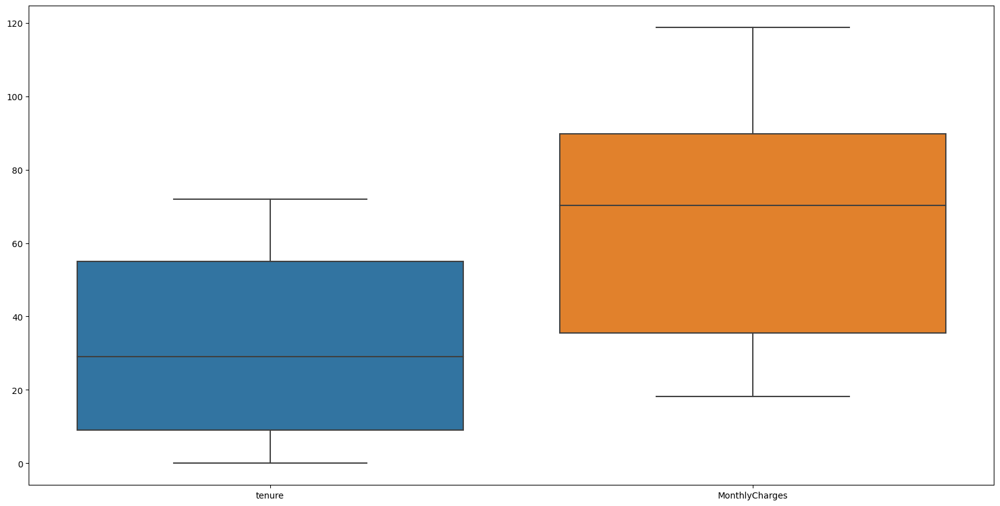

In [25]:
## Lets plot a boxplot for the numerical features
plt.figure(figsize=(20,10), facecolor='w')
# plotting boxplots for numerical columns
sns.boxplot(data=df1)
plt.show()

In [26]:
# Lets go feature by feature
# Lets see gender
churn['gender'].value_counts()

Male      3555
Female    3488
Name: gender, dtype: int64

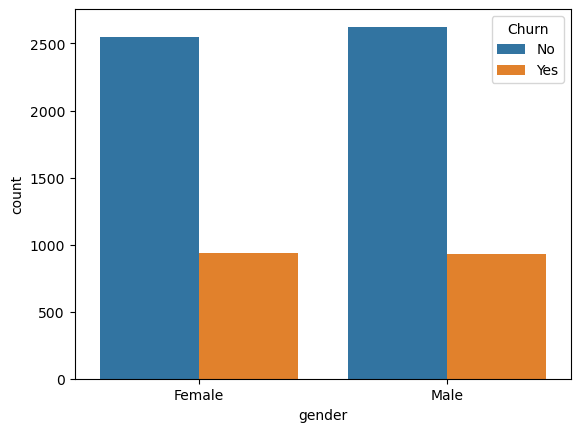

In [27]:
# Lets plot a countplot for gender 
sns.countplot(x='gender',hue='Churn',data=churn)
plt.show()

In [28]:
# Lets see Senior data Churn
Seniors = churn['SeniorCitizen'].value_counts()
Seniors

0    5901
1    1142
Name: SeniorCitizen, dtype: int64

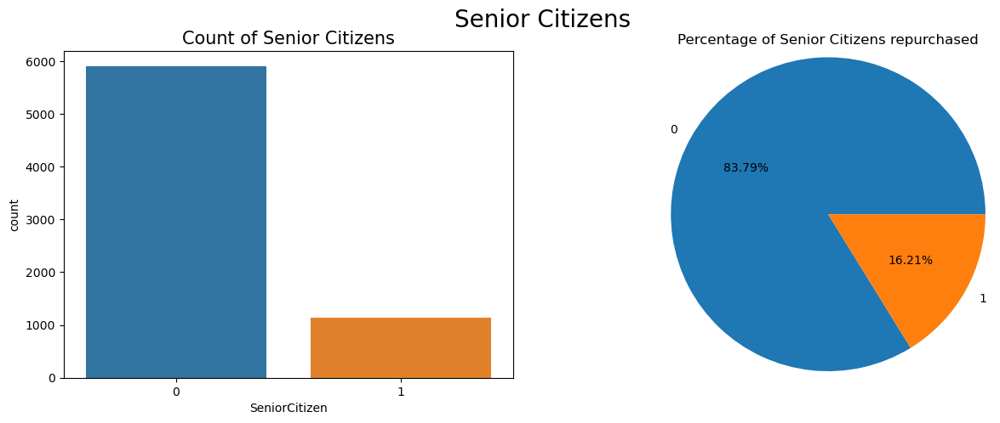

In [29]:
# 1 row and 2 columns subplots definition
fig, axes = plt.subplots(1,2,figsize=(15,5))
# Fixing supertitle
fig.suptitle('Senior Citizens',fontsize=20)

# count plot in first plot with the given column as axes[0] w.r.t Churn
sns.countplot(ax=axes[0],x='SeniorCitizen',data=churn)
# set the title of the plot
axes[0].set_title('Count of Senior Citizens',fontsize=15)

# pie plot in second plot of defined subplots w.r.t Churn
axes[1] = plt.pie(Seniors.values,labels=Seniors.index,radius=1.2,autopct='%1.2f%%')
# fix the title of the plot
plt.title('Percentage of Senior Citizens repurchased')
plt.show()

In [30]:
## Of the Senior Citizen, How many didn't turn up to purchase?
Seniors_churn = churn.groupby('SeniorCitizen')['Churn'].value_counts()
Seniors_churn

SeniorCitizen  Churn
0              No       4508
               Yes      1393
1              No        666
               Yes       476
Name: Churn, dtype: int64

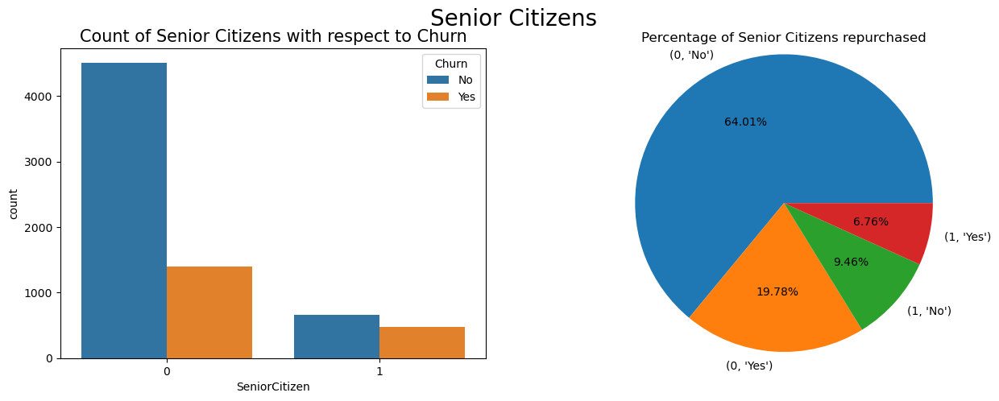

In [31]:
# 1 row and 2 columns subplots definition
fig, axes = plt.subplots(1,2,figsize=(15,5))
 # Fixing supertitle
fig.suptitle('Senior Citizens',fontsize=20)

# count plot in first plot with the given column as axes[0] w.r.t Churn
sns.countplot(ax=axes[0],x='SeniorCitizen',hue='Churn',data=churn)
# set the title of the plot
axes[0].set_title('Count of Senior Citizens with respect to Churn',fontsize=15)

# pie plot in second plot of defined subplots w.r.t Churn
axes[1] = plt.pie(Seniors_churn.values,labels=Seniors_churn.index,radius=1.2,autopct='%1.2f%%')
# fix the title of the plot
plt.title('Percentage of Senior Citizens repurchased')
plt.show()

In [32]:
# Lets see the Count of people who were not repeated customers with and without partners?
Partners = churn['Partner'].value_counts()
Partners

No     3641
Yes    3402
Name: Partner, dtype: int64

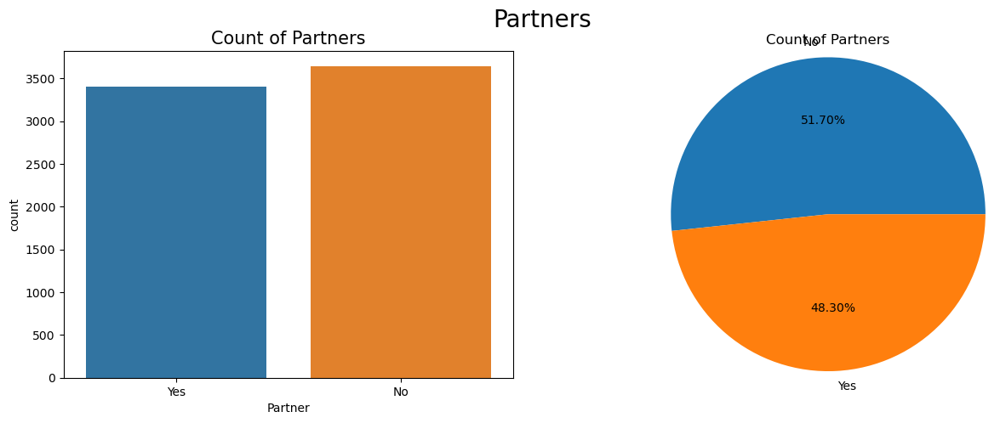

In [33]:
# 1 row and 2 columns subplots definition
fig, axes = plt.subplots(1,2,figsize=(15,5))
 # Fixing supertitle
fig.suptitle('Partners',fontsize=20)

# count plot in first plot with the given column as axes[0]
sns.countplot(ax=axes[0],x='Partner',data=churn)
# set the title of the plot
axes[0].set_title('Count of Partners',fontsize=15)

# pie plot in second plot of defined subplots
axes[1] = plt.pie(Partners.values,labels=Partners.index,radius=1.2,autopct='%1.2f%%')
# fix the title of the plot
plt.title('Count of Partners')
plt.show()

In [34]:
## Of the Partners, How many didn't turn up to purchase?
Partners_churn = churn.groupby('Partner')['Churn'].value_counts()
Partners_churn

Partner  Churn
No       No       2441
         Yes      1200
Yes      No       2733
         Yes       669
Name: Churn, dtype: int64

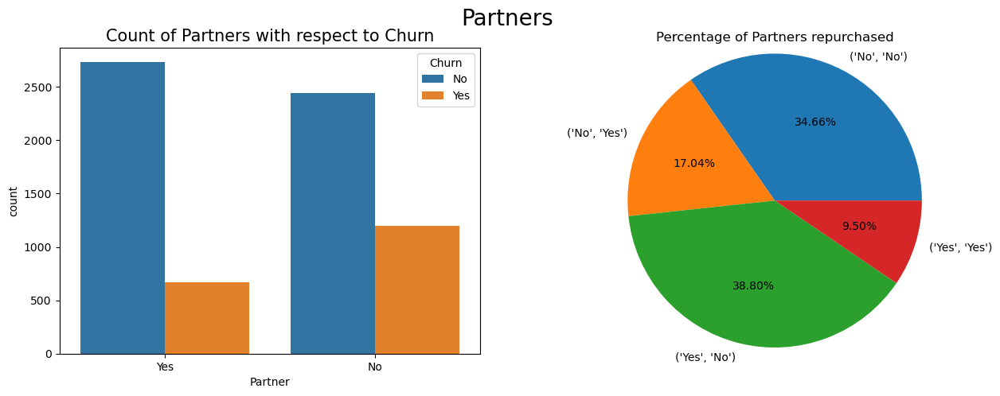

In [35]:
# 1 row and 2 columns subplots definition
fig, axes = plt.subplots(1,2,figsize=(15,5))
# Fixing supertitle
fig.suptitle('Partners',fontsize=20)

# count plot in first plot with the given column as axes[0] w.r.t Churn
sns.countplot(ax=axes[0],x='Partner',hue='Churn',data=churn)
# set the title of the plot
axes[0].set_title('Count of Partners with respect to Churn',fontsize=15)

# pie plot in second plot of defined subplots w.r.t Churn
axes[1] = plt.pie(Partners_churn.values,labels=Partners_churn.index,radius=1.2,autopct='%1.2f%%')
# fix the title of the plot
plt.title('Percentage of Partners repurchased')
plt.show()
# 38% of Partners continued to buy the product 

In [36]:
churn.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [37]:
#Writing a function to plot the count and pie plot
def plot_data(column):
    # 1 row and 2 columns subplots definition
    fig,axes = plt.subplots(1,2,figsize=(15,5))
    # Fixing supertitle
    fig.suptitle(column,fontsize=20)

    # count plot in first plot with the given column as axes[0]
    sns.countplot(ax=axes[0],x=column,data=churn)
    # Set the title of the plot
    axes[0].set_title('Count of {}s'.format(column),fontsize=15)
    # If there are more than 5 categories in the column, rotate labels
    if churn[column].value_counts().index.size>3: 
        # set labels and Rotate labels
        axes[0].set_xticklabels(labels=churn[column].value_counts().index,rotation=90)

    # pie plot in second plot of defined subplots
    axes[1] = plt.pie(churn[column].value_counts().values,labels=churn[column].value_counts().index,radius=1.2,autopct='%1.2f%%')
    # fix the title of the plot
    plt.title('Count of {}s'.format(column))
    plt.show()

In [38]:
# Writing a function to operate the same for all the features.
def plot_data_wrt_churn(column):
    # 1 row and 2 columns subplots definition
    fig, axes = plt.subplots(1,2,figsize=(15,5))
    # Fixing supertitle
    fig.suptitle(column,fontsize=20)

    # count plot in first plot with the given column as axes[0] w.r.t Churn
    sns.countplot(ax=axes[0],x=column,hue='Churn',data=churn)
    # Set the title of the plot
    axes[0].set_title('Count of {} with respect to Churn'.format(column),fontsize=15)
    # If there are more than 5 categories in the column, rotate labels
    if churn[column].value_counts().index.size>3: 
        # set labels and Rotate labels
        axes[0].set_xticklabels(labels=churn[column].value_counts().index,rotation=90)
    

    # pie plot in second plot of defined subplots w.r.t Churn
    axes[1] = plt.pie(churn.groupby(column)['Churn'].value_counts().values,labels=churn.groupby(column)['Churn'].value_counts().index,radius=1.2,autopct='%1.2f%%')
    # fix the title of the plot
    plt.title('Percentage of {}s repurchased'.format(column))
    plt.show()


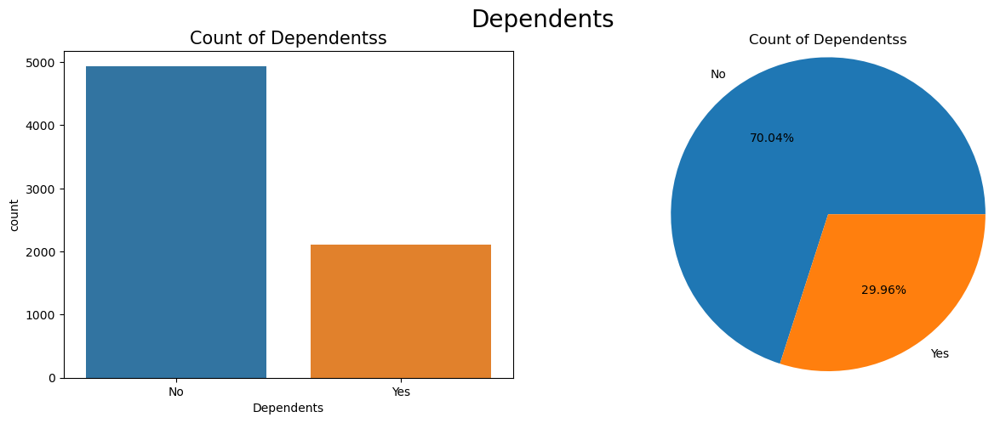

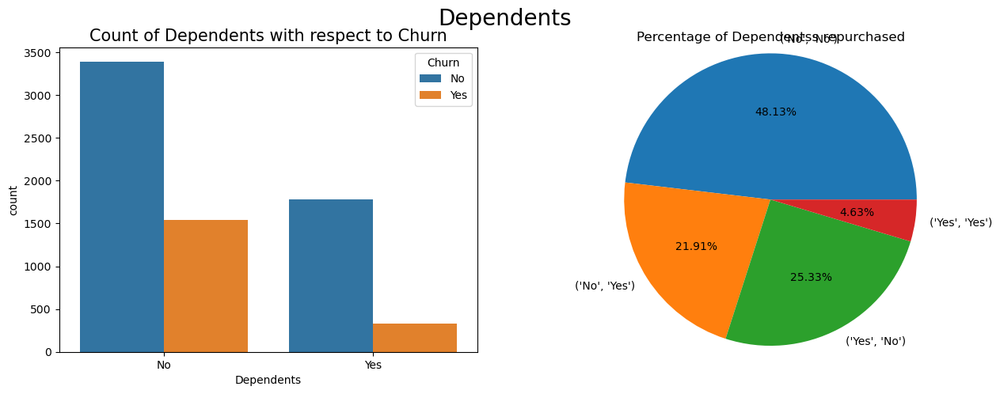

In [39]:
#Now we can directly call the functions and see the results here
#Lets go with dependents
plot_data('Dependents')
plot_data_wrt_churn('Dependents')

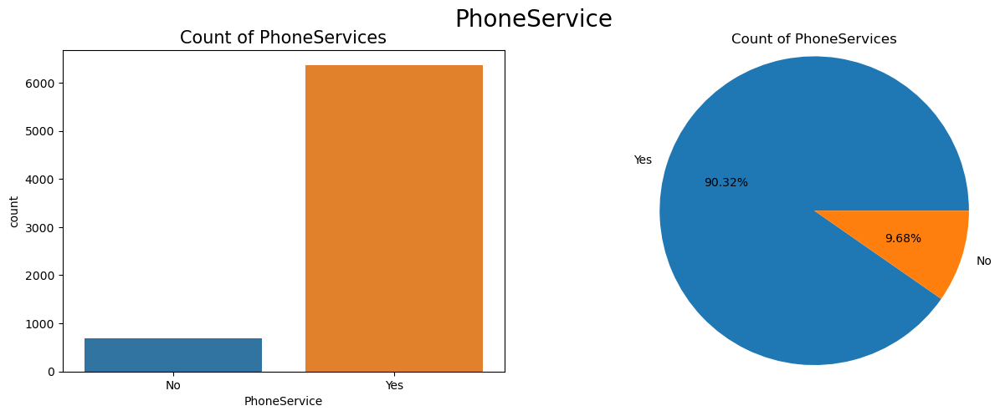

In [40]:
# Lets go with Phone Services
plot_data('PhoneService')

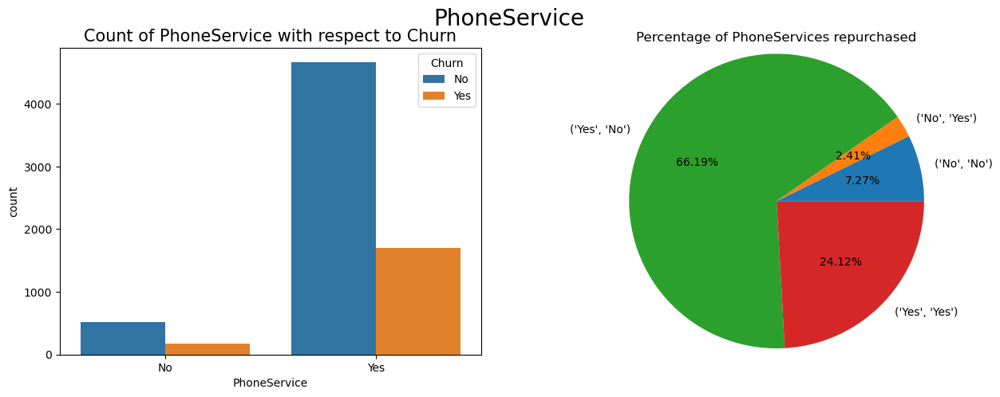

In [41]:
# Lets plot for Phone Services w.r.t Churn
plot_data_wrt_churn('PhoneService')

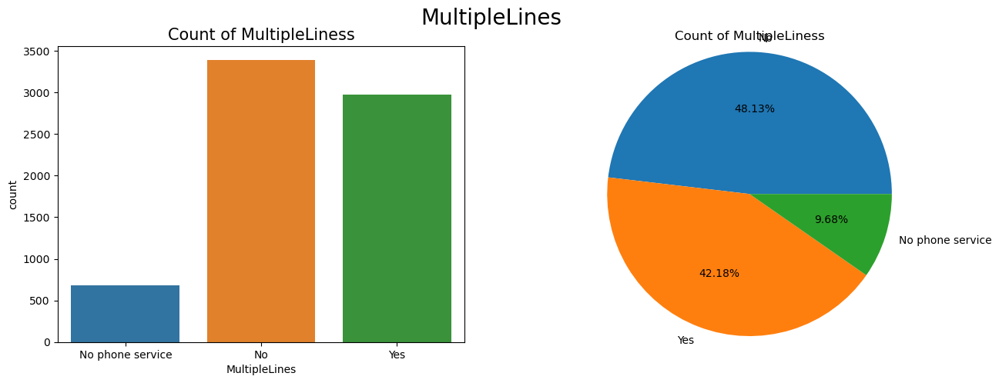

In [42]:
# Lets see Multiple Lines
plot_data('MultipleLines')

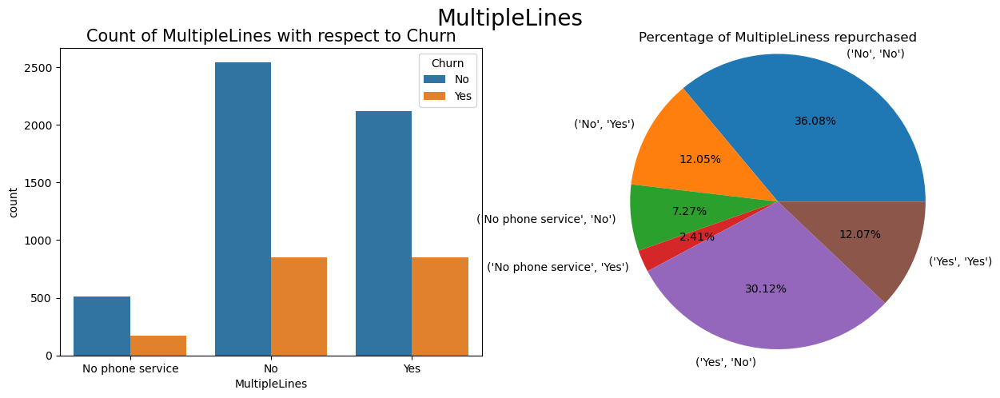

In [43]:
plot_data_wrt_churn('MultipleLines')

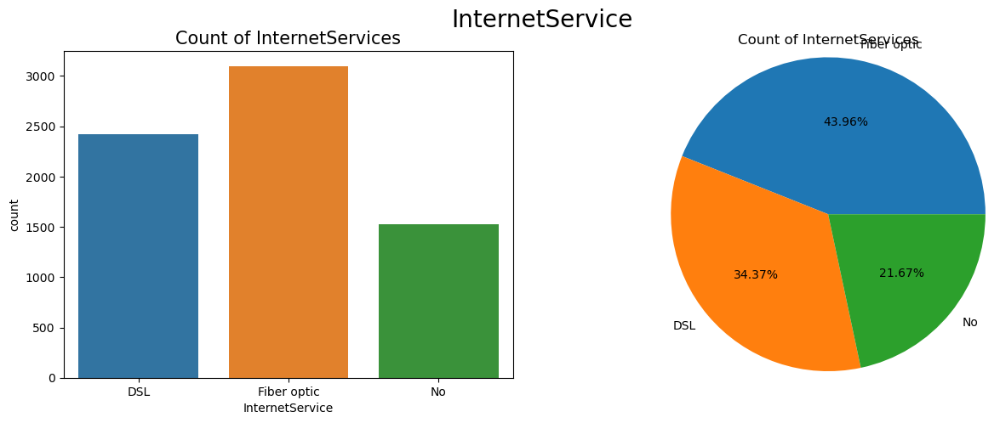

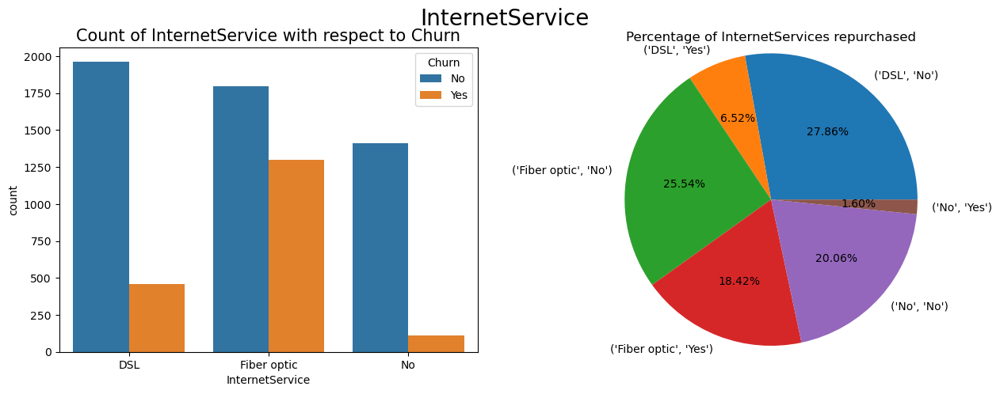

In [44]:
# Plot data for Internet Service
plot_data('InternetService')
# plot data w.r.t Churn for Internet Service
plot_data_wrt_churn('InternetService')

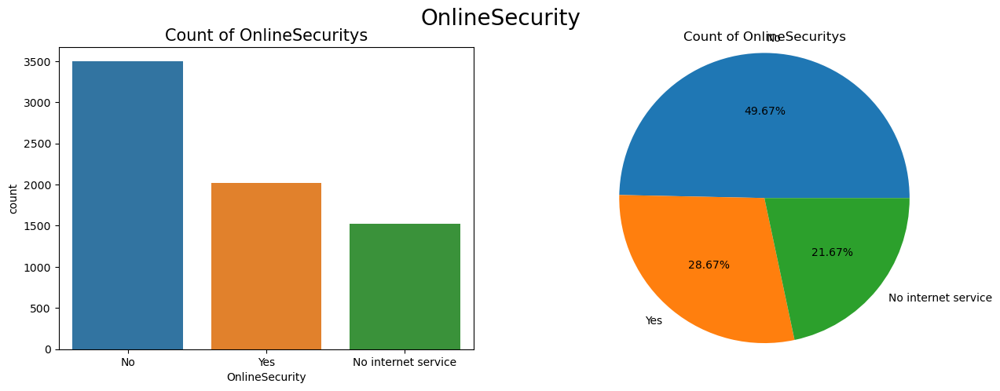

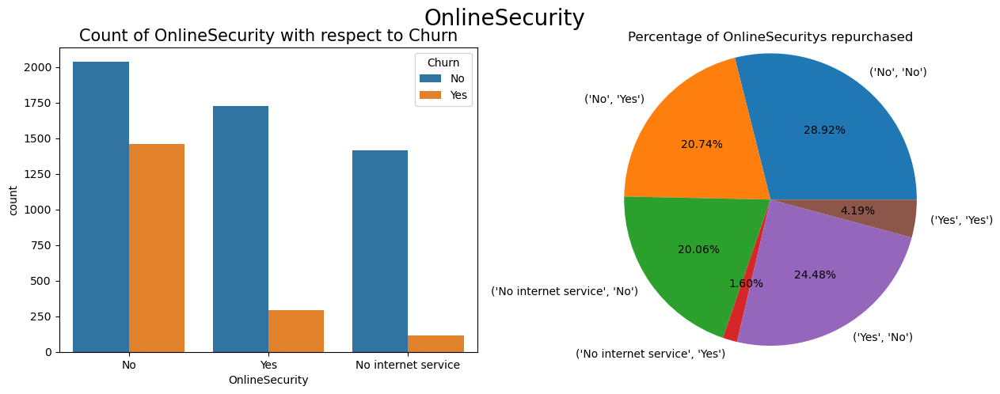

In [45]:
#How is Online security partition for Internet available people?
plot_data('OnlineSecurity')
plot_data_wrt_churn('OnlineSecurity')

In [46]:
# Instead of going column by column, we shall generalize the plots for rest of the data and get the conclusions written.
temp = churn[['OnlineBackup', 'DeviceProtection', 'TechSupport','StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling','PaymentMethod']]
temp.head(2)

,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod
0,Yes,No,No,No,No,Month-to-month,Yes,Electronic check
1,No,Yes,No,No,No,One year,No,Mailed check


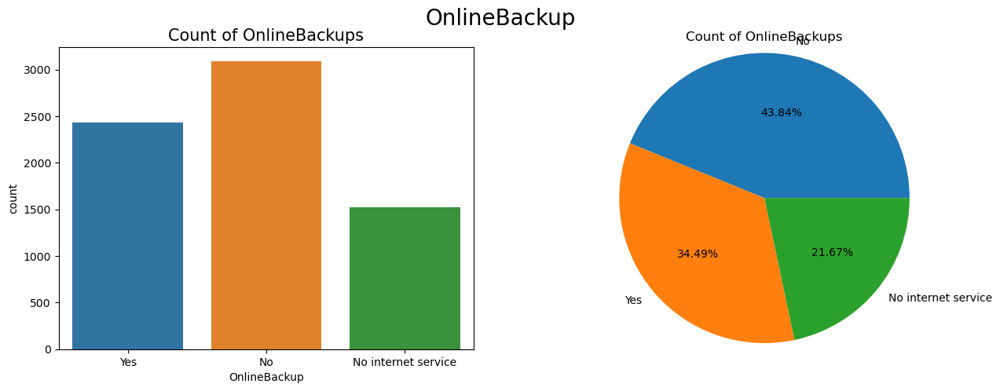

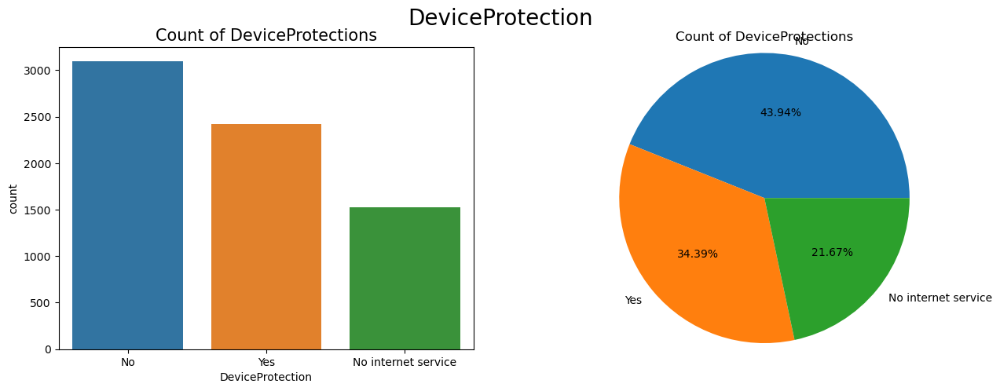

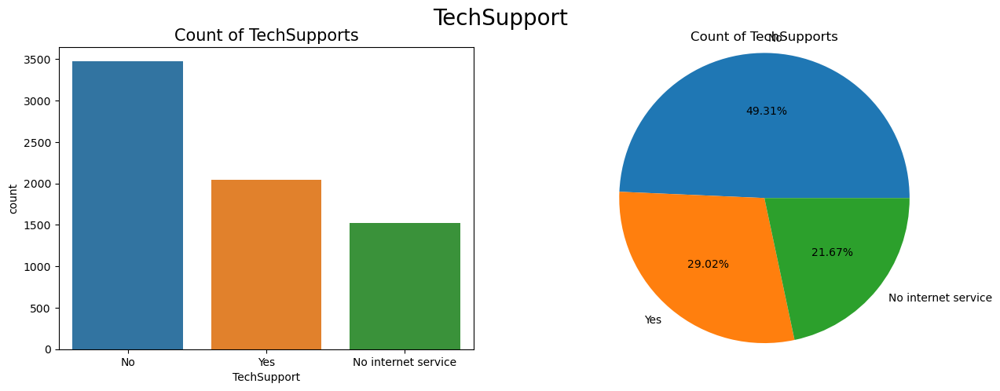

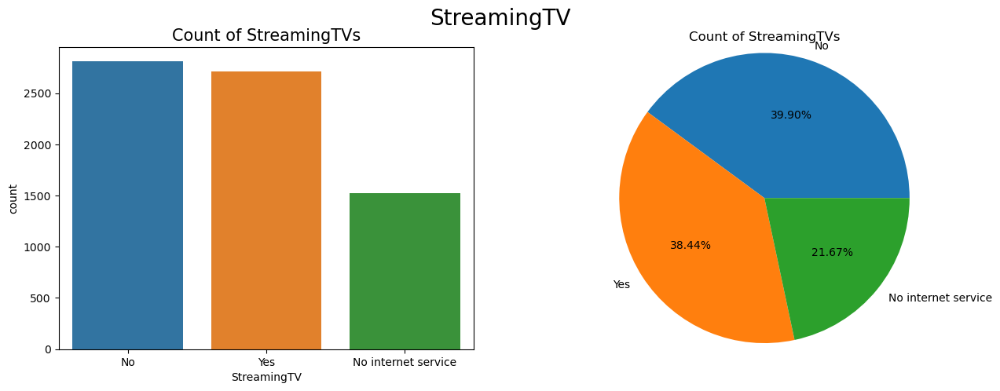

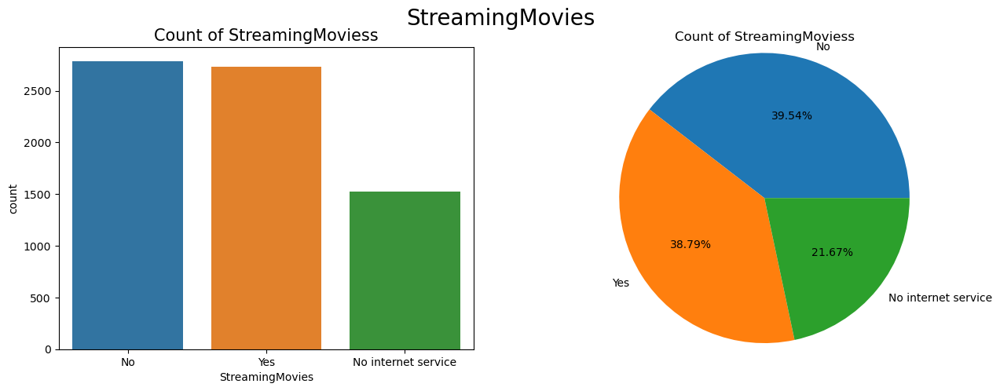

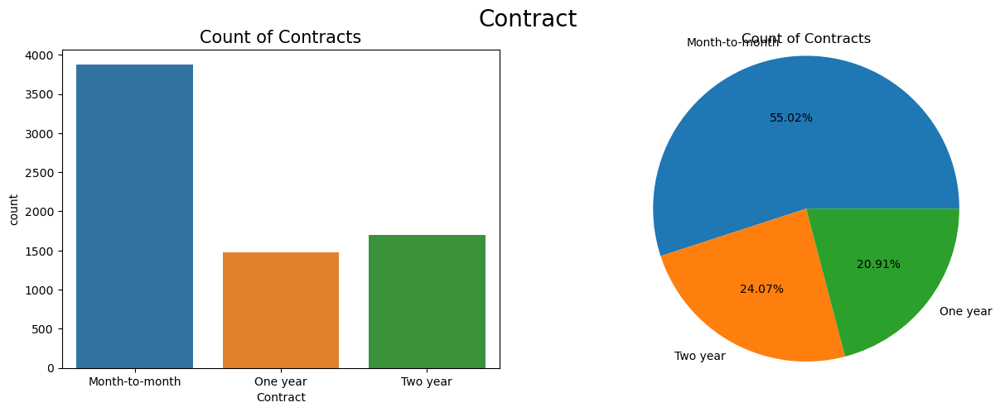

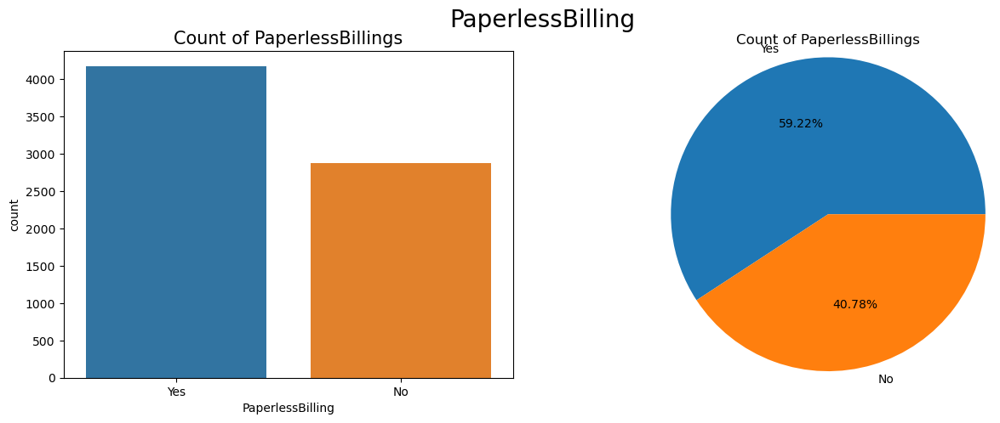

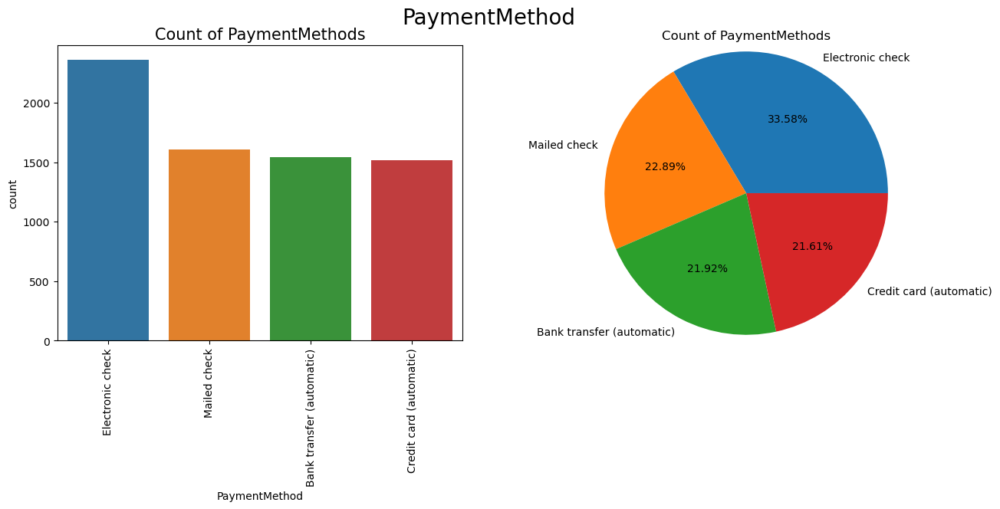

In [47]:
# generalising all the plots
for col in temp.columns:
    plot_data(col)

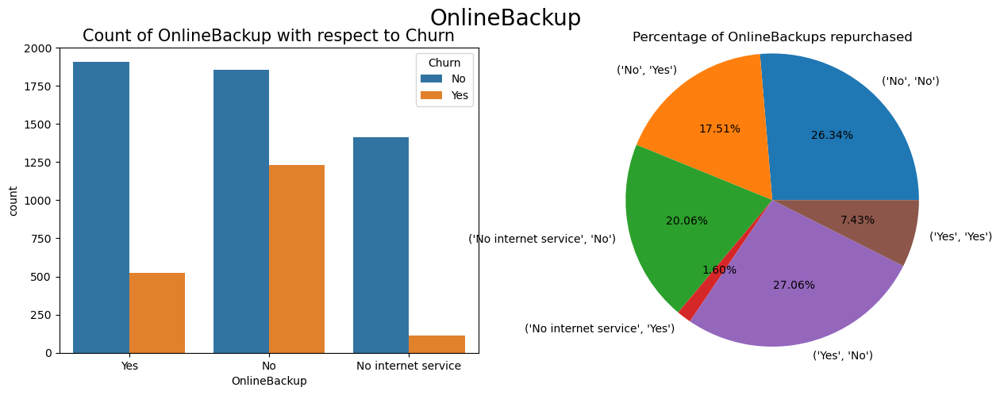

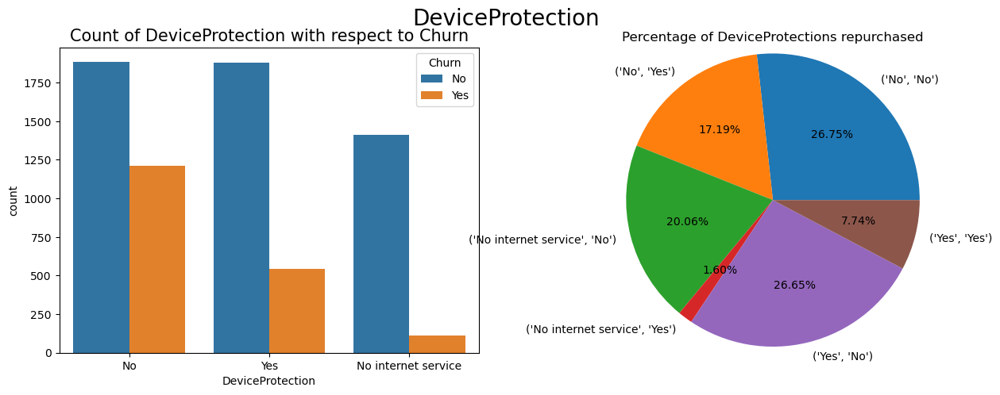

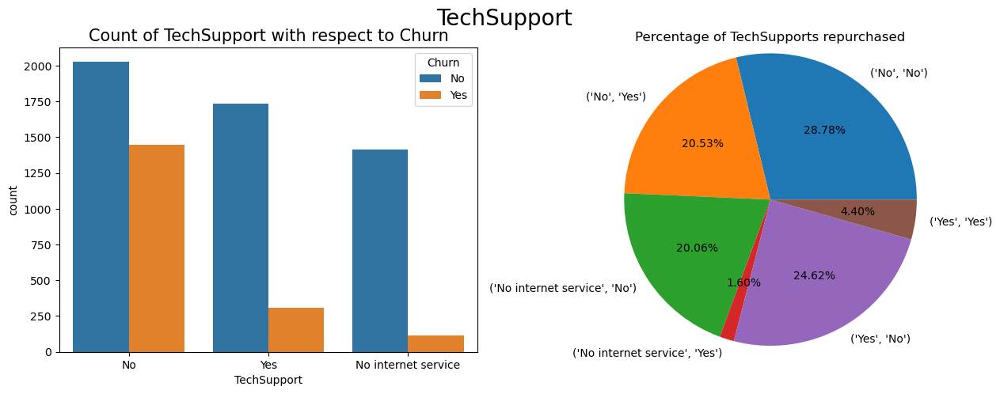

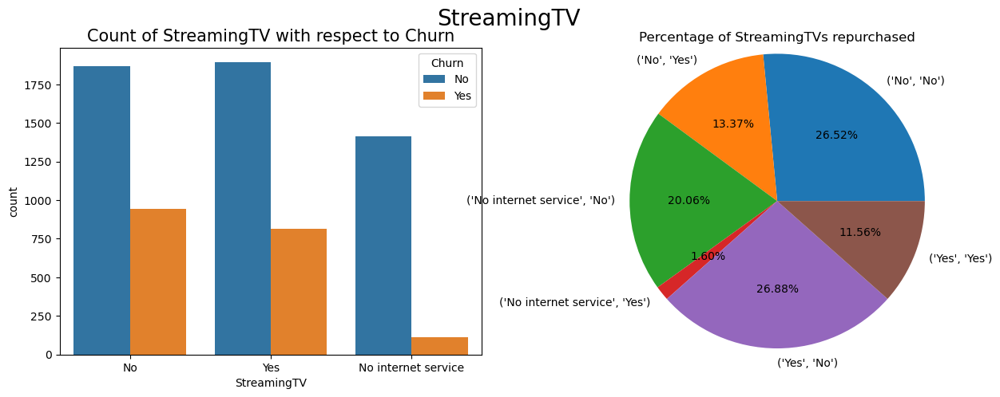

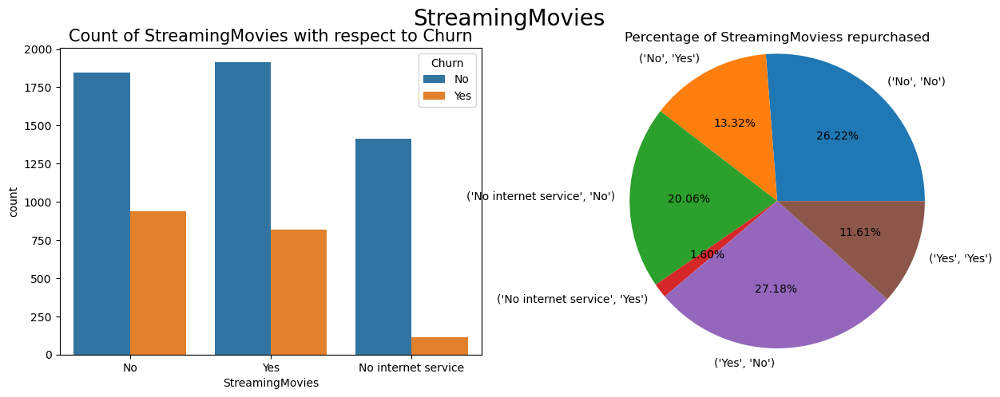

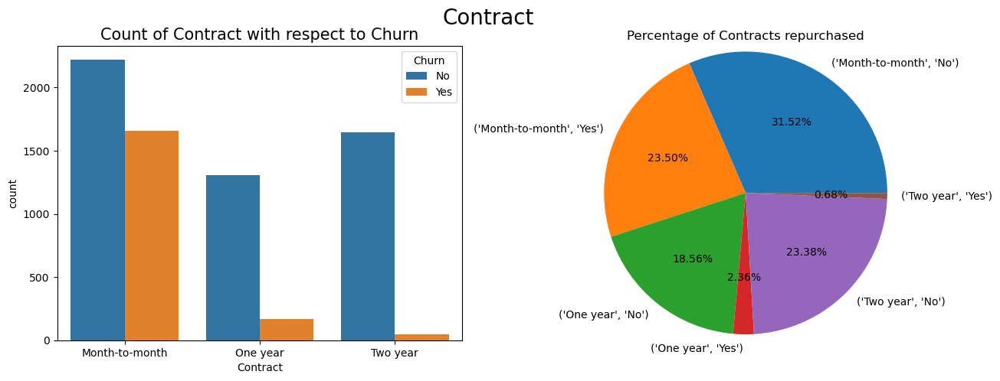

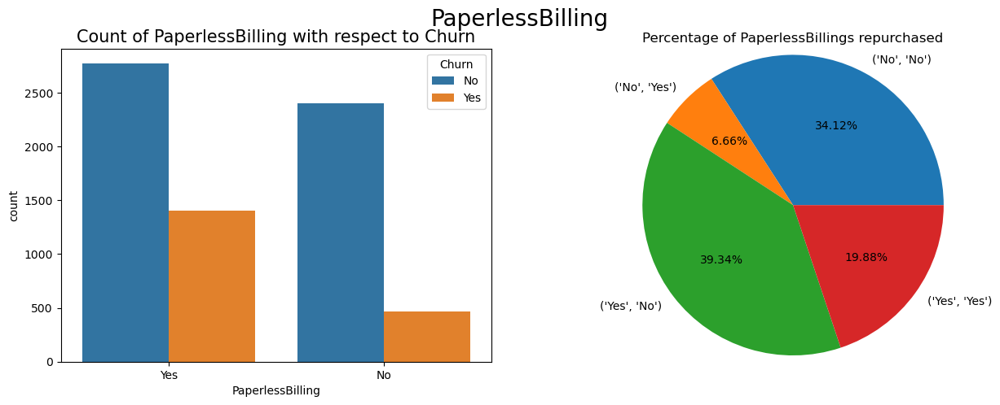

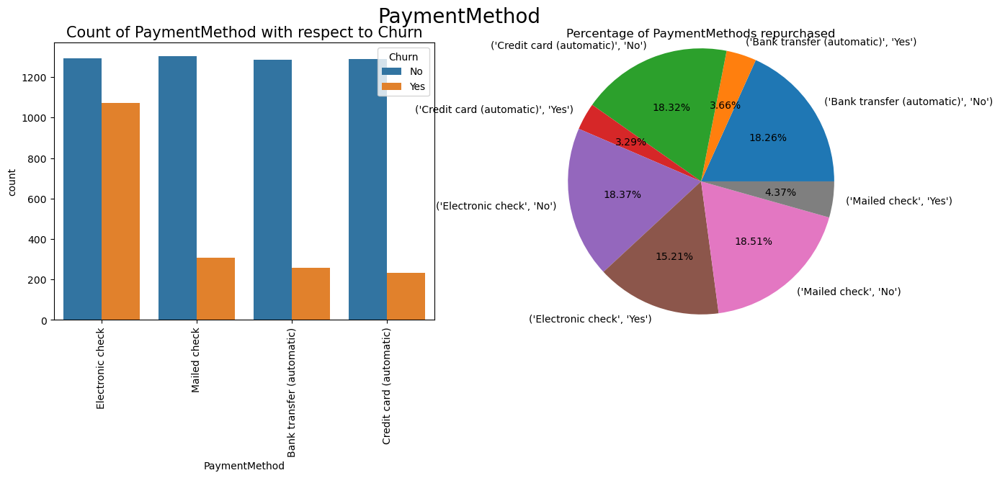

In [48]:
# generalising all the plots w.r.t churn
for col in temp.columns:
    plot_data_wrt_churn(col)

#### Now that we have performed EDA, Let perform more plots using plotly.

###  <mark style="background:yellow"> Here, We will look at different ways and params of plotting these categorical features. </mark>

In [49]:
# These are a few sets of palettes we will use here.

colors_1 = ['#1D4851','#9AB5BC','#FF9001','#FF4701']
sns.color_palette(colors_1)
colors_2 = ['#0D110F','#6F8C64','#FDD584','#2A4731']
sns.color_palette(colors_2)
colors_3 = ['#0B0B11','#8288C3','#242961','#D0BED4']
sns.color_palette(colors_3)
colors_4 = ['#645CAA','#A084CA','#BFACE0','#EBC7E8']
sns.color_palette(colors_4)
colors = ['#FF5851', '#F3C130', '#414A6B', '#B49A85', '#1C1B20']
sns.color_palette(colors)

[(1.0, 0.34509803921568627, 0.3176470588235294),
 (0.9529411764705882, 0.7568627450980392, 0.18823529411764706),
 (0.2549019607843137, 0.2901960784313726, 0.4196078431372549),
 (0.7058823529411765, 0.6039215686274509, 0.5215686274509804),
 (0.10980392156862745, 0.10588235294117647, 0.12549019607843137)]

### <mark> **1.Pie plots** </mark>

In [50]:
# plotting two pie charts with plotly
from plotly.subplots import make_subplots
## Lets plot the data using plotly for gender and churn
gender_labels = ['Male', 'Female']
churn_labels = ['No', 'Yes']

#  Make_cubplots function with type domain --> subplot traces they are individual
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
# Adding a trace(subplot) of pie type to the 'fig' list/dict of plots with labels,values, titles and subplot position
fig.add_trace(go.Pie(labels=gender_labels, values=churn['gender'].value_counts(), name="Gender"),1, 1)\
# Adding a trace(subplot) of pie type to the 'fig' list/dict of plots with labels,values, titles and subplot position
fig.add_trace(go.Pie(labels=churn_labels, values=churn['Churn'].value_counts(), name="Churn"),1, 2)
# There are update_traces,update_traces,update_annotations,update_layout,update_yaxes,update_xaxes for high level interface of plotly
# We are setting the traces with a hole (Inner diameter of pie plot), hover(label on top with percentage), fontsize of label
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)
# Complete layout with supertitle, annotations for both the features and their position is given
fig.update_layout(title_text="Gender and Churn Distributions",annotations=[dict(text='Gender', x=0.15, y=0.5, font_size=20, showarrow=False),
                 dict(text='Churn', x=0.81, y=0.5, font_size=20, showarrow=False)])
# Figure show; 
# Remember if its in colab; use fig.show(renderer='colab')
fig.show()

In [51]:
# Payment method distribution
# For Payment feature, labels and values are taken using value_counts
labels = churn['PaymentMethod'].unique()
values = churn['PaymentMethod'].value_counts()

# Using plotly.graph-objects, Lets plot a pie plot and see the difference
# graph objects for express is like seaborn for matplotlib
fig1 = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
# Update title text for the layout
fig1.update_layout(title_text="<b>Payment Method Distribution</b>")
# Figure show
fig1.show()

### <mark> 2.**Grouped bar Chart** </mark>

In [52]:
# Lets see a histogram for churn seperated by all the contract types
# Remember: Here, 'color' is not the design color, its 'hue' or the 'category'. 
# We are plotting the histogram for churn for every category of contract, <b> --> bold title
fig2 = px.histogram(churn,x='Churn',color='Contract',barmode='group',title="<b>Customer contract distribution<b>")
# Update layout with these measures and a gap between bars
fig2.update_layout(width=900,height=700,bargap=0.2)
fig2.show()

###  <mark> **3. Stacked Bar chart with a distribution** <br> </mark>

`Here, Lets see the use of 'marginal' and plot any distribution along with checking outliers`

In [53]:
# Lets see the distribution for Internet labels
Internet_labels = [0,1,2]
# Plotting histogram for monthly charges w.r.t Internet Service, labels are defined with title as well. 
# Important parameter here is 'marginal' distribution --> Box,violin,rug
fig3 = px.histogram(churn,x='MonthlyCharges',color='InternetService',nbins=11,labels=Internet_labels,title="Internet Service distribution",
                    marginal="box",color_discrete_sequence=colors[1:4])
# Layptu is updated for gap
fig3.update_layout(width=900,height=700,bargap=0.2)
fig3.show()

### <mark> 4. Adding bar charts in form of subplots  </mark>

In [54]:
# Foor barplots with 2,2 subplot_titles 
fig4 = make_subplots(rows=2, cols=2,
                    subplot_titles=['Gender Distribution', 'Senior Citizen Distribution', 'Partner Status', 'Dependents Status'])

# Adding subplots for features with value counts and labels as indexes in value counts
# Text is given as precentage of the each category in the feature, subplot position
fig4.add_trace(go.Bar(x=churn['gender'].value_counts().index, y=churn['gender'].value_counts().values, 
                     text=(churn['gender'].value_counts()*100/churn['gender'].shape[0]).round(2), width=[0.5, 0.5], marker={'color':colors[0]}), row=1, col=1)
fig4.add_trace(go.Bar(x=churn['SeniorCitizen'].value_counts().index, y=churn['SeniorCitizen'].value_counts().values, 
                     text=(churn['SeniorCitizen'].value_counts()*100/churn['SeniorCitizen'].shape[0]).round(2), width=[0.5, 0.5], marker={'color':colors[1]}), row=1, col=2)
fig4.add_trace(go.Bar(x=churn['Partner'].value_counts().index, y=churn['Partner'].value_counts().values, 
                     text=(churn['Partner'].value_counts()*100/churn['Partner'].shape[0]).round(2), width=[0.5, 0.5], marker={'color':colors[2]}), row=2, col=1)
fig4.add_trace(go.Bar(x=churn['Dependents'].value_counts().index, y=churn['Dependents'].value_counts().values, 
                     text=(churn['Dependents'].value_counts()*100/churn['Dependents'].shape[0]).round(2), width=[0.5, 0.5], marker={'color':colors[3]}), row=2, col=2)
# Update_layout for height 
fig4.update_layout(height=750, showlegend=False)
fig4.update_layout(title_text="<b>Distribution of Payment Terminations </b>")
fig4.show()

### <mark> 5. Combination of Grouped and Stack Barcharts </mark>

In [55]:
# Lets make a seperate datafrmae for ease of Understanding Dependents Churn
c=pd.get_dummies(data=churn[['gender','Partner','Dependents']],columns=['Dependents']).groupby(['gender','Partner']).sum().reset_index()
c
# We got a count based on gender and Partner category, Count of Dependents and not dependents

,gender,Partner,Dependents_No,Dependents_Yes
0,Female,No,1655.0,145.0
1,Female,Yes,805.0,883.0
2,Male,No,1625.0,216.0
3,Male,Yes,848.0,866.0


In [56]:
# Lets plot a Bar plot for Dependents count w.r.t gender and Partner
fig5 = go.Figure()
# Add a subplot for a bar plot with hovertext based on Partners
fig5.add_trace(go.Bar(x=c['gender'],y=c['Dependents_No'],name='No Dependents',hovertext=["Partner: No", "Partner: Yes", "Partner: No", "Partner: Yes"],marker_color=colors_4[0:4]))
fig5.add_trace(go.Bar(x=c['gender'],y=c['Dependents_Yes'],name='Dependents',hovertext=["Partner: No", "Partner: Yes", "Partner: No", "Partner: Yes"],marker_color=colors_4[0:4]))
fig5.update_layout(title_text="<b>Distribution of Payment Terminations </b>",showlegend=True)
fig5.show()

###  <mark>5. Subplots using Barcharts </mark>

In [57]:
# We are plotting every feature and arranging it in a bar plot in 3*3 format. 
fig9 = make_subplots(rows=3, cols=3,subplot_titles=['PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
                  'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies'],horizontal_spacing=0.1)

# Adding a subplot for every feature by feature in the above subplot_titles 
# Its the same as above, except that row,col has to be mentioned
fig9.add_trace(go.Bar(x=churn['PhoneService'].value_counts().index, y=churn['PhoneService'].value_counts(), 
                     text=(churn['PhoneService'].value_counts()*100/churn['PhoneService'].shape[0]).round(2), 
                     width=[0.5, 0.5], marker={'color':colors_4[0]}), row=1, col=1)
fig9.add_trace(go.Bar(x=churn['MultipleLines'].value_counts().index, y=churn['MultipleLines'].value_counts(), 
                     text=(churn['MultipleLines'].value_counts()*100/churn['MultipleLines'].shape[0]).round(2), 
                     width=[0.5, 0.5, 0.5], marker={'color':colors_4[1]}), row=1, col=2)
fig9.add_trace(go.Bar(x=churn['InternetService'].value_counts().index, y=churn['InternetService'].value_counts(), 
                     text=(churn['InternetService'].value_counts()*100/churn['InternetService'].shape[0]).round(2), 
                     width=[0.5, 0.5, 0.5], marker={'color':colors_4[2]}), row=1, col=3)
fig9.add_trace(go.Bar(x=churn['OnlineSecurity'].value_counts().index, y=churn['OnlineSecurity'].value_counts(), 
                     text=(churn['OnlineSecurity'].value_counts()*100/churn['OnlineSecurity'].shape[0]).round(2), 
                     width=[0.5, 0.5, 0.5], marker={'color':colors_4[0]}), row=2, col=1)
fig9.add_trace(go.Bar(x=churn['OnlineBackup'].value_counts().index, y=churn['OnlineBackup'].value_counts(), 
                     text=(churn['OnlineBackup'].value_counts()*100/churn['OnlineBackup'].shape[0]).round(2), 
                     width=[0.5, 0.5, 0.5], marker={'color':colors_4[1]}), row=2, col=2)
fig9.add_trace(go.Bar(x=churn['DeviceProtection'].value_counts().index, y=churn['DeviceProtection'].value_counts(), 
                     text=(churn['DeviceProtection'].value_counts()*100/churn['DeviceProtection'].shape[0]).round(2), 
                     width=[0.5, 0.5, 0.5], marker={'color':colors_4[2]}), row=2, col=3)
fig9.add_trace(go.Bar(x=churn['TechSupport'].value_counts().index, y=churn['TechSupport'].value_counts(), 
                     text=(churn['TechSupport'].value_counts()*100/churn['TechSupport'].shape[0]).round(2), 
                     width=[0.5, 0.5, 0.5], marker={'color':colors_4[0]}), row=3, col=1)
fig9.add_trace(go.Bar(x=churn['StreamingTV'].value_counts().index, y=churn['StreamingTV'].value_counts(), 
                     text=(churn['StreamingTV'].value_counts()*100/churn['StreamingTV'].shape[0]).round(2), 
                     width=[0.5, 0.5, 0.5], marker={'color':colors_4[1]}), row=3, col=2)
fig9.add_trace(go.Bar(x=churn['StreamingMovies'].value_counts().index, y=churn['StreamingMovies'].value_counts(), 
                     text=(churn['StreamingMovies'].value_counts()*100/churn['StreamingMovies'].shape[0]).round(2), 
                     width=[0.5, 0.5, 0.5], marker={'color':colors_4[2]}), row=3, col=3)
fig9.update_layout(height=750, showlegend=False,title_text='<b> Analysis of Communication Churn')
fig9.show()

### <mark> 6. Isolated Histograms </mark>
**We will see the 'facet_col' which explains `facet_plots` or `trellis plots` where they make a minor subplots isolating different categories in the feature data.**

In [58]:
# Lets plot a histogram with tenure w.r.t Contract basis
# Histogram of tenure for every contract type
fig6 = px.histogram(churn, x='tenure',facet_col='Contract',height=300, color_discrete_sequence=colors_2[1:],
                    title='Distribution in different contracts vs tenure')
fig6.show()

In [59]:
fig7 = px.histogram(churn, x='tenure', facet_col='PaymentMethod', height=300, color_discrete_sequence=colors_3[2:],
                    title='Distribution in different payment methods vs tenure')
fig7.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
fig7.show()

**Similar to the earlier plots, we are using `facet_row` along with `facet_col` for plotting facet_plots**

In [60]:
fig8 = px.histogram(churn, x='tenure', facet_col='Dependents', facet_row='Partner',height=500, color_discrete_sequence=colors_2[1:],title='Dependents and Partners distribution')
fig8.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
fig8.show()

### <mark> 6. Marginal Histograms </mark>

In [61]:
# Columns for all the histogram plots
cols = ['PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup','DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies','PaymentMethod','Contract']

# For all the columns, plotting histogram by churn, with a grouped bar mode
# We include violin marginal distribution with a sequence of colors 
for i in cols:
    fig10 = px.histogram(data_frame=churn,x=i, color=churn['Churn'], barmode='group', height=750, width=800, 
                       text_auto=True,marginal='violin',labels=i,
                       color_discrete_sequence=colors[2:4],title='{} distribution'.format(i))
    fig10.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
    fig10.show()

### <mark> 11. Animations </mark>

**Lets plot the MonthlyCharges vs TotalCharges, which means validating total charges based on a scale of Monthlycharges for every frame of tenure.** <br>
We use `animation_frame` here to make this. 


In [62]:
# Lets also see a sample animation 
fig12 = px.scatter(data_frame=churn, x="MonthlyCharges", y="TotalCharges", animation_frame="tenure",
                  color="tenure",height=350, width=800, color_discrete_sequence=colors[2:4])
fig12.show()

In [63]:
# A similar animation for variation of PaymentMethod for different month/monthlycharges in the grouped bar format
fig13 = px.histogram(data_frame=churn,x='PaymentMethod', color='Churn', barmode='group',animation_frame='MonthlyCharges',height=750, width=800, 
                       text_auto=True,marginal='violin',labels=i,
                       color_discrete_sequence=colors[2:4],title='{} distribution'.format(i))
fig13.show()

In [64]:
temp.columns

Index(['OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod'],
      dtype='object')

## <mark><span style="color:Purple">Encoding the categorical variables</span> </mark>


In [65]:
# Encoding ordinal data - Gender
# Remember that ordinal data is different from nominal data 
churn['gender'] = churn['gender'].map({'Male':0,'Female':1})
churn.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,0,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No


In [66]:
# Lets change the variables - Partner
churn['Partner'] = churn['Partner'].map({'Yes':1,'No':0})
churn.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,0,1,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,0,0,0,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No


In [67]:
# Converting them into numerical variables - Dependents
churn['Dependents'] = churn['Dependents'].map({'Yes':1,'No':0})
churn.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,0,1,0,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,0,0,0,0,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No


In [68]:
# Lets calculate the same for Phone Services
churn['PhoneService'] = churn['PhoneService'].map({'Yes':1,'No':0})
churn.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,0,1,0,1,0,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,0,0,0,0,34,1,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No


In [69]:
# Encode data for MultipleLines
churn['MultipleLines'] = churn['MultipleLines'].map({'Yes':1,'No':0,'No phone service':0})
churn.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,0,1,0,1,0,0,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,0,0,0,0,34,1,0,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No


In [70]:
# InternetService
churn['InternetService'] = churn['InternetService'].map({'DSL':1,'Fiber optic':2,'No':0})
churn.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,0,1,0,1,0,0,1,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,0,0,0,0,34,1,0,1,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No


In [71]:
# OnlineSecurity
churn['OnlineSecurity'] = churn['OnlineSecurity'].map({'Yes':1,'No':0,'No internet service':0})
churn.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,0,1,0,1,0,0,1,0,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,0,0,0,0,34,1,0,1,1,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No


In [72]:
#Lets encode the variable for every column:

#Online Backup
churn['OnlineBackup'] = churn['OnlineBackup'].map({'Yes':1,'No':0,'No internet service':0})
#Device Protection
churn['DeviceProtection'] = churn['DeviceProtection'].map({'Yes':1,'No':0,'No internet service':0})

In [73]:
#TechSupport
churn['TechSupport'] = churn['TechSupport'].map({'Yes':1,'No':0,'No internet service':0})
#StreamingTV
churn['StreamingTV'] = churn['StreamingTV'].map({'Yes':1,'No':0,'No internet service':0})
#StreamingMovies
churn['StreamingMovies'] = churn['StreamingMovies'].map({'Yes':1,'No':0,'No internet service':0})

In [74]:
#Contract
churn['Contract'] = churn['Contract'].map({'Month-to-month':1,'One year':12,'Two year':24})


In [75]:
#Paperless Billing
churn['PaperlessBilling'] = churn['PaperlessBilling'].map({'Yes':1,'No':0})
#PaymentMethod
churn['PaymentMethod'] = churn['PaymentMethod'].map({'Electronic check':1,'Mailed check':2,'Bank transfer (automatic)':3,'Credit card (automatic)':4})

churn.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,0,1,0,1,0,0,1,0,...,0,0,0,0,1,1,1,29.85,29.85,No
1,5575-GNVDE,0,0,0,0,34,1,0,1,1,...,1,0,0,0,12,0,2,56.95,1889.5,No


### <span style="color:red"> Lets solve a few questions for inferences!! </span>

In [76]:
# How many customers are not Seniors and Not dependents nor Partners
Not_SDP = churn.loc[(churn['SeniorCitizen']==0) & (churn['Partner']==0) & (churn['Dependents']==0)]
Not_SDP.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
1,5575-GNVDE,0,0,0,0,34,1,0,1,1,...,1,0,0,0,12,0,2,56.95,1889.5,No
2,3668-QPYBK,0,0,0,0,2,1,0,1,1,...,0,0,0,0,1,1,2,53.85,108.15,Yes


In [77]:
Not_SDP['Churn'].value_counts() #there are 38% of people with no Seniors, Partners and dependents
# of them, 31% turned up to Churn

No     1872
Yes     847
Name: Churn, dtype: int64

In [78]:
churn['Churn'] = churn['Churn'].map({'Yes':1,'No':0})
churn.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,0,1,0,1,0,0,1,0,...,0,0,0,0,1,1,1,29.85,29.85,0
1,5575-GNVDE,0,0,0,0,34,1,0,1,1,...,1,0,0,0,12,0,2,56.95,1889.5,0


## <mark><span style="color:Purple">Automated EDA </span> </mark>

In [79]:
# Now that we have seen the Feature Engineering and EDA step by step. Lets do this using Automated EDA
# We use dataprep library to perform EDA.

In [1]:
# from dataprep.eda import create_report
# create_report(churn)

Now that we have seen Automated EDA with Dataprep, Lets do the same with Pandas Profiling

The below code helps to automate complete EDA with pandas-profiling

In [81]:
# Install the below libraries using the below code


In [2]:
# !pip install pandas-profiling

In [3]:
# !pip install sweetviz 

In [4]:
# from pandas_profiling import ProfileReport
# profile = ProfileReport(churn)
# profile.to_file('output.html')
# profile

In [5]:
# import sweetviz as sv
# my_report = sv.analyze(churn)
# my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"
# check the local depository to open this again

## <mark><span style="color:Purple">Feature Engineering </span> </mark>

In [87]:
churn.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,0,1,0,1,0,0,1,0,...,0,0,0,0,1,1,1,29.85,29.85,0
1,5575-GNVDE,0,0,0,0,34,1,0,1,1,...,1,0,0,0,12,0,2,56.95,1889.5,0


## <mark> <span style="color:green">Correlation </span> </mark>

In [88]:
# Style change - Look for more styles - 'ggplot','dark_background','Solarize_Light2','bmh','grayscale' etc..,
plt.style.use('fivethirtyeight')

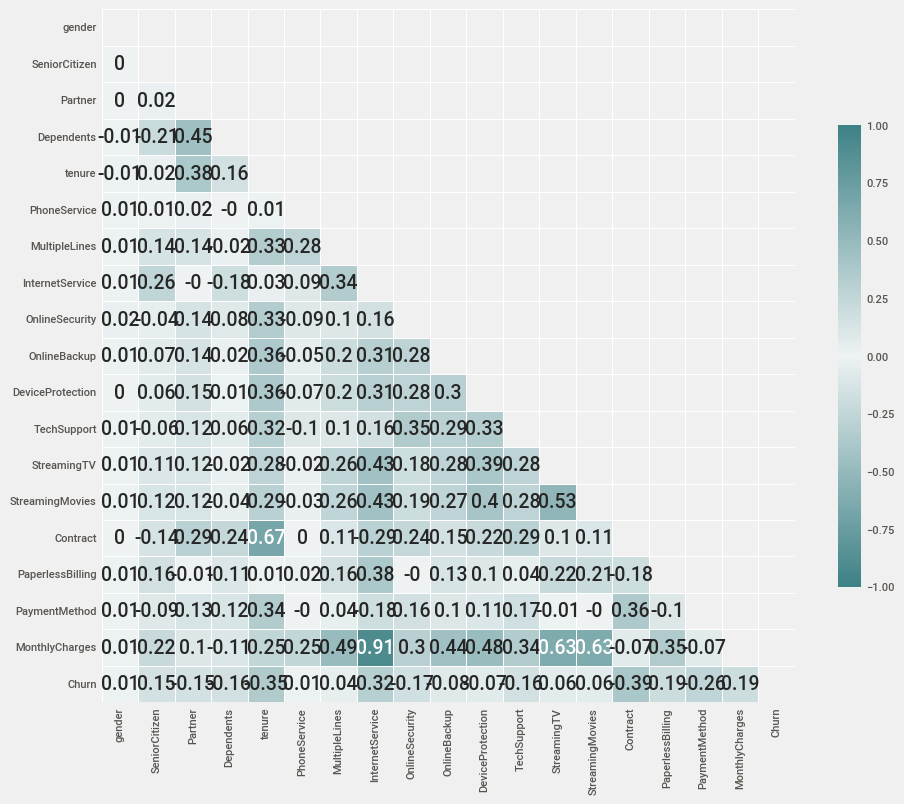

In [89]:
corr = churn.corr().round(1)
mask = np.zeros_like(corr,dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
fig11,ax11 = plt.subplots(figsize=(10,10))
cmap = sns.diverging_palette(200,200,as_cmap=True)
sns.heatmap(corr,mask=mask,cmap=cmap,vmin=-1,vmax=1,center=0,square=True,linewidths=.5,cbar_kws={"shrink":0.5},annot=True)
plt.tight_layout()
plt.show()

## <mark><span style="color:Brown">Feature Scaling</span></mark>


In [90]:
# We should scale the data to bring the data to uniform scale
# import Scaling libraries; Use any of the Scalers to scale the data
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Scaling using Standard deviation
ss = StandardScaler()
# Converting the array output of Standardization to a dataframe
churn['tenure'] = ss.fit_transform(churn[['tenure']])
churn['MonthlyCharges'] = ss.fit_transform(churn[['MonthlyCharges']])
churn.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,0,1,0,-1.277445,0,0,1,0,...,0,0,0,0,1,1,1,-1.160323,29.85,0
1,5575-GNVDE,0,0,0,0,0.066327,1,0,1,1,...,1,0,0,0,12,0,2,-0.259629,1889.5,0
2,3668-QPYBK,0,0,0,0,-1.236724,1,0,1,1,...,0,0,0,0,1,1,2,-0.362660,108.15,1
3,7795-CFOCW,0,0,0,0,0.514251,0,0,1,1,...,1,1,0,0,12,0,3,-0.746535,1840.75,0
4,9237-HQITU,1,0,0,0,-1.236724,1,0,2,0,...,0,0,0,0,1,1,1,0.197365,151.65,1


##   <mark><span style="color:orange">Feature Importances</span></mark>

 <mark>**1. Using Decision tree** </mark>

In [91]:
churn.drop(['customerID','TotalCharges'],axis=1,inplace=True)

In [92]:
# For finding important features, we need to seperate the dataframe
X = churn.drop('Churn',axis=1)
y = churn['Churn']

In [93]:
# Decision Tree instance
dtree = DecisionTreeClassifier()
# fit the model
dtree.fit(X,y)
# Find the important features using feature_importances_
Important_features_tree = dtree.feature_importances_
Important_features_tree

array([0.03068046, 0.01894874, 0.03011365, 0.02136904, 0.19048551,
       0.00373573, 0.01942793, 0.05650598, 0.01924141, 0.01904772,
       0.02122635, 0.01901   , 0.01063856, 0.01351416, 0.16993074,
       0.02389221, 0.05131918, 0.28091264])

In [94]:
# Attach the columns of X to the feature importance labels
columns = X.columns
# Converting into a dataframe
feature_importance_tree = pd.DataFrame(Important_features_tree)
# Attach columns to it
feature_importance_tree['columns'] = columns.T

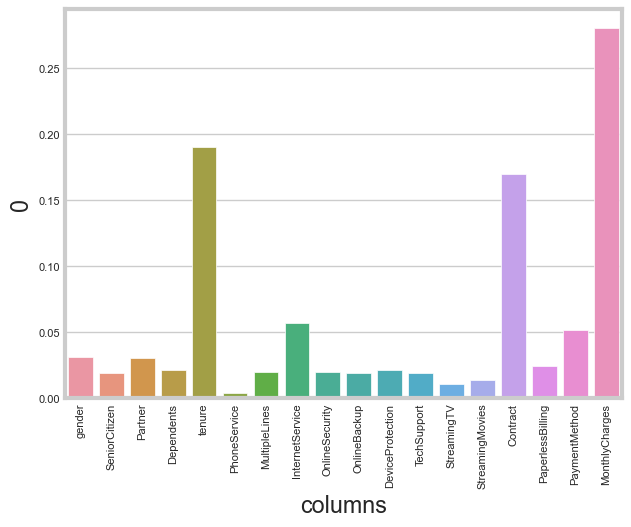

In [95]:
# Lets plot a barplot to visualize the important features
sns.set_style('whitegrid')
# Bar plot
sns.barplot(data=feature_importance_tree,x='columns',y=feature_importance_tree[0])
# rotate the labels
plt.xticks(rotation=90)
plt.show()

<mark>**2. Using Random Forest**</mark>

In [96]:
# Random Forest instance
rf = RandomForestClassifier()
# fit the model
rf.fit(X,y)
# Find the important features using feature_importances_
Important_features_rf = rf.feature_importances_
Important_features_rf

array([0.03279344, 0.02428559, 0.02644408, 0.02221098, 0.23736711,
       0.00792998, 0.02206222, 0.05313791, 0.02605374, 0.02466173,
       0.02310447, 0.02494173, 0.01989381, 0.02017128, 0.09128207,
       0.02948835, 0.0691421 , 0.24502942])

In [97]:
# Attach the columns of X to the feature importance labels
columns = X.columns
# Converting into a dataframe
feature_importance_rf = pd.DataFrame(Important_features_rf)
# Attach columns to it
feature_importance_rf['columns'] = columns.T

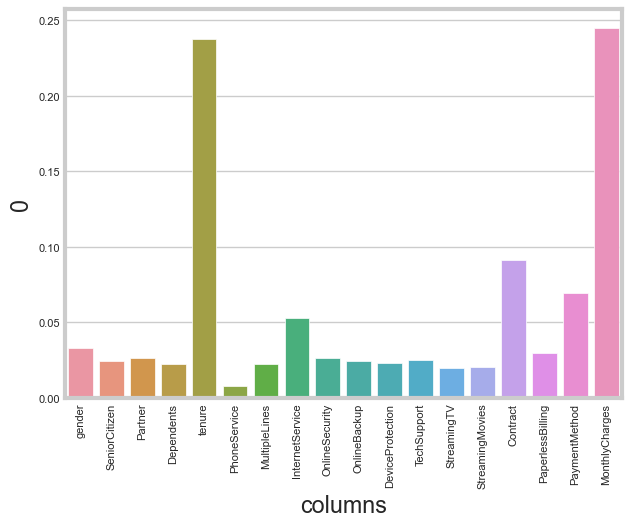

In [98]:
# Lets plot a barplot to visualize the important features
sns.set_style('whitegrid')
# Bar plot
sns.barplot(data=feature_importance_rf,x='columns',y=feature_importance_rf[0])
# rotate the labels
plt.xticks(rotation=90)
plt.show()

In [99]:
churn.head(2)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,Churn
0,1,0,1,0,-1.277445,0,0,1,0,1,0,0,0,0,1,1,1,-1.160323,0
1,0,0,0,0,0.066327,1,0,1,1,0,1,0,0,0,12,0,2,-0.259629,0


### `Train-test split`

In [100]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=0)
print(X_train.shape,y_train.shape,X_test.shape,y_test.shape)

(5634, 18) (5634,) (1409, 18) (1409,)


## <mark> Model Building

In [101]:
# Creating an instance of the model here with the basic parameters
# Here, we are not dealing with the best model as we don't know the status of the parameters
gbm = xgb.XGBClassifier(max_depth=3, n_estimators=300, learning_rate=0.05).fit(X_train,y_train)
# predicting the X_test
predictions = gbm.predict(X_test)
# accuracy_score from the predictions
accuracy_score(y_test, predictions)

0.7821149751596878

In [102]:
# Identifying the categorical features as 
categorical_features_indices = np.where(X_train.dtypes != np.float)[0]
categorical_features_indices

array([ 0,  1,  2,  3,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16],
      dtype=int64)

## <mark>Evaluation metrics

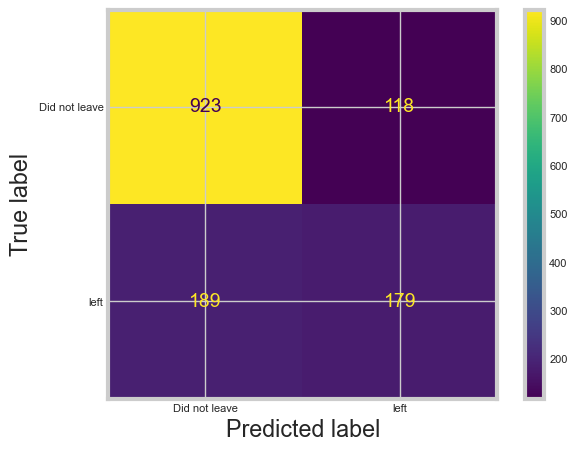

In [121]:
# Plotting confusion_matrix with the earlier model
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(gbm,X_test,y_test,values_format='d',display_labels=['Did not leave', 'left'])
plt.show()

In [112]:
## Classification report
from sklearn.metrics import classification_report
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.83      0.89      0.86      1041
           1       0.60      0.49      0.54       368

    accuracy                           0.78      1409
   macro avg       0.72      0.69      0.70      1409
weighted avg       0.77      0.78      0.77      1409



In [105]:
# Libraries for evaluation metrics
import sklearn.metrics as plot_metrics
from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import RocCurveDisplay


In [106]:
# Lets plot all the metrics
def plot_metric(X_test,y_test,predictions):
  #print('Root Mean Square Error of the model: ',metrics.rmse(y_test,predictions))
    print('---------ROC Curve for the model--------')
    RocCurveDisplay.from_estimator(gbm, X_test, y_test)
    plot_roc_curve(gbm,X_test,y_test)

In [122]:
plot_metric(X_test,y_test,predictions)

---------ROC Curve for the model--------


In [123]:
# Plot precision recall curve
print("-------Precision Recall Curve-----------")
plot_precision_recall_curve(gbm,X_train,y_train)
plot_precision_recall_curve(gbm,X_test,y_test)

-------Precision Recall Curve-----------


## <mark>Hyperparameter tuning</mark>

From all the models and iterations here, 
We have three important hyperparameters. <br>
Gamma- threshold for pruning; lambda- Regualrizes overfitting; learning_rate-stepsize shrinkage; <br>
We usually calculate `similarity score` for this model which is defined as <br>
Similarity_score = ((Sum of Residuals) / (No of Residuals or variables + lambda)) <br>

Lets check every parameter now, what happens if there is overfitting, increase lambda such that it controls score <br>
Next, Control learning rate, such that the residuals sum is reduced. <br>
Or Regulate gamma, which in return emphasizes pruning. <br>

### Model-1. Initiating and Introducing parameters

In [109]:
# New XGBoost Model
clf_xgb = xgb.XGBClassifier(objective='binary:logistic', 
                            gamma=0.25,             # Minimum loss reduction required to make a further partition on a leaf
                            learn_rate=0.1,         # Eta, step size shrinkage used in update to prevents overfitting
                            max_depth=4,            # Maximum depth of a tree
                            reg_lambda=10,          # Lambda, L2 regularization term on weights.
                            scale_pos_weight=3,     # Control the balance of positive and negative weights
                            subsample=0.9,          # Randomly sample part of the training data prior to growing trees
                            colsample_bytree=0.5,   # Subsampling of columns
                            missing=None,
                            use_label_encoder=False,
                            seed=42)                              

clf_xgb.fit(X_train,     
            y_train,     
            verbose=True,                 # Verbosity of printing messages
            early_stopping_rounds=10,     # After 10 trees without improvement, stop (avoid overfitting)
            eval_metric='aucpr',          # Area under the PR curve
            eval_set=[(X_test,y_test)])   # Train with the train dataset, but evaluete the how many trees with the test dataset

[16:29:47] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "learn_rate" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-aucpr:0.56184
[1]	validation_0-aucpr:0.56284
[2]	validation_0-aucpr:0.58769
[3]	validation_0-aucpr:0.59509
[4]	validation_0-aucpr:0.60376
[5]	validation_0-aucpr:0.59716
[6]	validation_0-aucpr:0.61915
[7]	validation_0-aucpr:0.61779
[8]	validation_0-aucpr:0.61913
[9]	validation_0-aucpr:0.61758
[10]	validation_0-aucpr:0.61745
[11]	validation_0-aucpr:0.61862
[12]	validation_0-aucpr:0.61790
[13]	validation_0-aucpr:0.62296
[14]	validation_0-aucpr:0.62250
[15]	validation_0-aucpr:0.62423
[16]	validation_0-aucpr:0.62709
[17]	validation_0-aucpr:0.62813
[18]	validation

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.5,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0.25, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='', learn_rate=0.1,
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=4, max_leaves=0, min_child_weight=1,
              missing=None, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=42,
              reg_alpha=0, ...)

In the above code, in fitting the model, We used early stopping rounds as 10. <br>
It means that 

### Model-2. n_estimators inclusion <br>
n_estimators is given 1 emphasizing single tree to check the basic features of a single tree. 

In [117]:
# Create a XGBoost Model with 'n_estimators=1', to make the tree
clf_xgb = xgb.XGBClassifier(objective='binary:logistic', 
                            gamma=0.25,             
                            learn_rate=0.1,         
                            max_depth=4,            
                            reg_lambda=10,          
                            scale_pos_weight=3,     
                            subsample=0.9,          
                            colsample_bytree=0.5,    
                            missing=None,
                            use_label_encoder=False,
                            n_estimators=1,          # build one tree, so we can get gain, cover, etc.
                            seed=42)                              

clf_xgb.fit(X_train, y_train)
bst = clf_xgb.get_booster()
for importance_type in ('weight', 'gain', 'cover', 'total_gain', 'total_cover'):
    print('%s ' % importance_type, bst.get_score(importance_type=importance_type))   
node_params = {'shape':'box',
               'style': 'filled, rounded',
               'fillcolor': '#78cbe'}
leaf_params = {'shape':'box',
               'style': 'fille',
               'fillcolor': '#e48038'}

[16:36:31] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "learn_rate" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


weight  {'tenure': 2.0, 'InternetService': 2.0, 'Contract': 2.0, 'PaymentMethod': 3.0, 'MonthlyCharges': 3.0}
gain  {'tenure': 140.73712158203125, 'InternetService': 152.17706298828125, 'Contract': 949.1619873046875, 'PaymentMethod': 28.139928817749023, 'MonthlyCharges': 49.23720169067383}
cover  {'tenure': 656.125, 'InternetService': 771.375, 'Contract': 1069.75, 'PaymentMethod': 363.0833435058594, 'MonthlyCharges': 275.75}
total_gain  {'tenure': 281.4742431640625, 'InternetService': 304.3541259765625, 'Contract': 1898.323974609375, 'PaymentMethod': 84.41978454589844, 'Mont

## What do we understand from the above code?
- **Gain** : The relative contribution of the corresponding feature to the model calculated by taking each feature’s contribution for each tree in the model. A higher value of this metric when compared to another feature implies it is more important for generating a prediction.

- **Coverage** : The relative number of observations related to this feature. For example, if you have 100 observations, 4 features and 3 trees, and suppose feature1 is used to decide the leaf node for 10, 5, and 2 observations in tree1, tree2 and tree3 respectively; then the metric will count cover for this feature as 10+5+2 = 17 observations. This will be calculated for all the 4 features and the cover will be 17 expressed as a percentage for all features cover metrics.

- **Weight** : The percentage representing the relative number of times a particular feature occurs in the trees of the model. In the above example, if feature1 occurred in 2 splits, 1 split and 3 splits in each of tree1, tree2 and tree3; then the weight for feature1 will be 2+1+3 = 6. The frequency for feature1 is calculated as its percentage weight over weights of all features.

These features are important to understand the dependency on the output. 
If they create huge impact having high correlation with them, there must be a way to reduce it.

## Feature Importance based on each feature of estimator <br>
Two important functions of xgboost used here are get_booster() and get_score() function to get the best feature and its score

In [124]:
#We will plot feature importances with these factors for the above algorithm
feat_importance = pd.Series(clf_xgb.get_booster().get_score(importance_type='gain')).sort_values(ascending=False)
feat_importance.plot(kind='bar', title='Feature Importances by gain')
plt.ylabel('Feature Importance Score')

Text(0, 0.5, 'Feature Importance Score')

In [125]:
feat_importance = pd.Series(clf_xgb.get_booster().get_score(importance_type='cover')).sort_values(ascending=False)
feat_importance.plot(kind='bar', title='Feature Importances by cover')
plt.ylabel('Feature Importance Score')

Text(0, 0.5, 'Feature Importance Score')

In [126]:
feat_importance = pd.Series(clf_xgb.get_booster().get_score(importance_type='weight')).sort_values(ascending=False)
feat_importance.plot(kind='bar', title='Feature Importances by weight')
plt.ylabel('Feature Importance Score')

Text(0, 0.5, 'Feature Importance Score')

In [127]:
feat_importance = pd.Series(clf_xgb.get_booster().get_score(importance_type='total_cover')).sort_values(ascending=False)
feat_importance.plot(kind='bar', title='Feature Importances by total_cover')
plt.ylabel('Feature Importance Score')

Text(0, 0.5, 'Feature Importance Score')

In [128]:
feat_importance = pd.Series(clf_xgb.get_booster().get_score(importance_type='total_gain')).sort_values(ascending=False)
feat_importance.plot(kind='bar', title='Feature Importances by total_gain')
plt.ylabel('Feature Importance Score')

Text(0, 0.5, 'Feature Importance Score')

In [129]:
#xgb.to_graphviz(clf_xgb, num_tree=4)

### Model fitting, Cross-validation and Feature Importance for every iteration is not advisable.

### General function to process predictions, cross validation, accuracy, Feature Importance

In [131]:
from sklearn import metrics
# function with algorithm model, X,y-details, Cross validation folds, early stopping after data is stabilised
def modelfit(alg,X_train,y_train,X_test,y_test,useTrainCV=True, cv_folds=5, early_stopping_rounds=50):
    # AS we are using TrainCV;
    if useTrainCV:
        # Get xgboost parameters
        xgb_param = alg.get_xgb_params()
        # X_train,y_train values 
        xgtrain = xgb.DMatrix(X_train.values, label=y_train.values)
        # Crossvalidation with the parameters and early stopping
        cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=alg.get_params()['n_estimators'], nfold=cv_folds,
            metrics='auc', early_stopping_rounds=early_stopping_rounds)
        alg.set_params(n_estimators=cvresult.shape[0])
    
    #Fit the algorithm on the data
    alg.fit(X_train,y_train,eval_metric='auc')
    #Predict training set:
    dtrain_predictions = alg.predict(X_test)
    dtrain_predprob = alg.predict_proba(X_test)[:,1]
        
    #Print model report:
    print("\nModel Report")
    print("Accuracy : %.4g" % metrics.accuracy_score(y_test.values, dtrain_predictions))
    print("AUC Score (Train): %f" % metrics.roc_auc_score(y_test.values, dtrain_predprob))
      
    # Feature Importance using get_booster() and get_score()
    feat_importance = pd.Series(alg.get_booster().get_score()).sort_values(ascending=False)
    feat_importance.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')

**Here, we are preparing three models with various parameters with GridSearchCV**

In [132]:
#Choose all predictors except target & IDcols
# predictors = [x for x in X_train.columns if x not in ['Churn']]
xgb1 = xgb.XGBClassifier(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=5,
 min_child_weight=1,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'binary:logistic',
 nthread=4,
 scale_pos_weight=1,
 seed=27)

In [133]:
modelfit(gbm,X_train,y_train,X_test,y_test)


Model Report
Accuracy : 0.7892
AUC Score (Train): 0.827798


In [134]:
# Tune max_depth and min_child_weight
from sklearn.model_selection import GridSearchCV
param_test1 = {
 'max_depth':range(3,10,2),
 'min_child_weight':range(1,6,2)
}
gsearch1 = GridSearchCV(estimator = xgb.XGBClassifier(learning_rate =0.1, n_estimators=140, max_depth=5,min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
objective= 'binary:logistic', nthread=4, scale_pos_weight=1, seed=27), 
param_grid = param_test1, scoring='roc_auc',n_jobs=4, cv=5)
gsearch1.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=0.8,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=0, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, max_bin=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=5,
                                     max_leaves=None, min_child_weight=1,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=140, n_jobs=None, nthread=4,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None, ...),
             n_jobs=4,
             param_grid={'max_depth': range(3, 10, 2),
                         'min_child_weight': range(1, 6, 2)},
             scoring='roc_auc')

In [135]:
gsearch1.cv_results_, gsearch1.best_params_, gsearch1.best_score_

({'mean_fit_time': array([0.70092707, 0.72433   , 1.25586967, 2.24495225, 2.1964323 ,
         2.20392022, 3.11177087, 3.01162667, 2.93516898, 4.06626444,
         3.78280034, 3.16895976]),
  'std_fit_time': array([0.03190727, 0.07090773, 0.23866696, 0.00933445, 0.04089827,
         0.04847134, 0.02873336, 0.06366425, 0.07384372, 0.04390741,
         0.03566019, 0.39155588]),
  'mean_score_time': array([0.0125946 , 0.01163621, 0.01886649, 0.01715851, 0.01759696,
         0.0163106 , 0.01910748, 0.01830635, 0.01638799, 0.02395678,
         0.01855693, 0.01596956]),
  'std_score_time': array([0.00528451, 0.00875738, 0.00352218, 0.00168482, 0.00188774,
         0.00152309, 0.00612389, 0.00278182, 0.00077739, 0.00556494,
         0.00360672, 0.00017934]),
  'param_max_depth': masked_array(data=[3, 3, 3, 5, 5, 5, 7, 7, 7, 9, 9, 9],
               mask=[False, False, False, False, False, False, False, False,
                     False, False, False, False],
         fill_value='?',
         

In [136]:
modelfit(gsearch1.best_estimator_, X_train,y_train,X_test,y_test)


Model Report
Accuracy : 0.7921
AUC Score (Train): 0.828686


In [137]:
# Time to check with next parameters
param_test2 = {
 'max_depth':[4,5,6],
 'min_child_weight':[4,5,6]
}
gsearch2 = GridSearchCV(estimator = xgb.XGBClassifier( learning_rate=0.1, n_estimators=140, max_depth=5,
 min_child_weight=2, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1,seed=27), 
 param_grid = param_test2, scoring='roc_auc', cv=5)
gsearch2.fit(X_train,y_train)
gsearch2.cv_results_, gsearch2.best_params_, gsearch2.best_score_

({'mean_fit_time': array([0.83637724, 0.86845889, 0.83726764, 1.00483003, 0.98012505,
         1.00268979, 1.09822941, 1.11452699, 1.0953114 ]),
  'std_fit_time': array([0.0159496 , 0.0647756 , 0.01654844, 0.03096826, 0.0101585 ,
         0.03601914, 0.01448405, 0.02607575, 0.01821549]),
  'mean_score_time': array([0.01622734, 0.02018185, 0.01712489, 0.01557155, 0.02549157,
         0.01562853, 0.02187314, 0.02273922, 0.01723595]),
  'std_score_time': array([7.54854888e-04, 1.51768069e-02, 9.83897859e-04, 1.15122692e-04,
         5.05014163e-03, 5.62061371e-06, 7.65607745e-03, 7.25466395e-03,
         6.58918912e-03]),
  'param_max_depth': masked_array(data=[4, 4, 4, 5, 5, 5, 6, 6, 6],
               mask=[False, False, False, False, False, False, False, False,
                     False],
         fill_value='?',
              dtype=object),
  'param_min_child_weight': masked_array(data=[4, 5, 6, 4, 5, 6, 4, 5, 6],
               mask=[False, False, False, False, False, False, False, 

In [138]:
modelfit(gsearch2.best_estimator_, X_train,y_train,X_test,y_test)


Model Report
Accuracy : 0.7913
AUC Score (Train): 0.828793


In [139]:
param_test2b = {
 'min_child_weight':[6,8,10,12]
}
gsearch2b = GridSearchCV(estimator = xgb.XGBClassifier( learning_rate=0.1, n_estimators=140, max_depth=4,
 min_child_weight=2, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1,seed=27), 
 param_grid = param_test2b, scoring='roc_auc',n_jobs=4, cv=5)
gsearch2b.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=0.8,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=0, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, max_bin=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=4,
                                     max_leaves=None, min_child_weight=2,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=140, n_jobs=None, nthread=4,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None, ...),
             n_jobs=4, param_grid={'min_child_weight': [6, 8, 10, 12]},
             scoring='roc_auc')

In [140]:
gsearch2b.cv_results_, gsearch2b.best_params_, gsearch2b.best_score_

({'mean_fit_time': array([2.28890634, 2.03742938, 2.4011651 , 2.12628446]),
  'std_fit_time': array([0.16855629, 0.17050598, 0.21834933, 0.22386606]),
  'mean_score_time': array([0.03642726, 0.02424636, 0.04083533, 0.02154646]),
  'std_score_time': array([0.01037237, 0.00272451, 0.02081078, 0.00302476]),
  'param_min_child_weight': masked_array(data=[6, 8, 10, 12],
               mask=[False, False, False, False],
         fill_value='?',
              dtype=object),
  'params': [{'min_child_weight': 6},
   {'min_child_weight': 8},
   {'min_child_weight': 10},
   {'min_child_weight': 12}],
  'split0_test_score': array([0.85077791, 0.85172108, 0.85250302, 0.85413744]),
  'split1_test_score': array([0.85205562, 0.84932285, 0.85350262, 0.85250101]),
  'split2_test_score': array([0.84128174, 0.83975816, 0.8409472 , 0.84175534]),
  'split3_test_score': array([0.83717109, 0.83916807, 0.83913187, 0.84111276]),
  'split4_test_score': array([0.8512954 , 0.85004843, 0.85247377, 0.85243543]),
  '

In [141]:
modelfit(gsearch2b.best_estimator_, X_train,y_train,X_test,y_test)


Model Report
Accuracy : 0.7928
AUC Score (Train): 0.830172


In [142]:
param_test3 = {
 'gamma':[i/10.0 for i in range(0,5)]
}
gsearch3 = GridSearchCV(estimator = xgb.XGBClassifier( learning_rate =0.1, n_estimators=140, max_depth=4,
 min_child_weight=6, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1,seed=27), 
 param_grid = param_test3, scoring='roc_auc',n_jobs=4, cv=5)
gsearch3.fit(X_train,y_train)
gsearch3.cv_results_, gsearch3.best_params_, gsearch3.best_score_

({'mean_fit_time': array([3.02240629, 2.61272044, 2.62995238, 2.19890213, 1.65754609]),
  'std_fit_time': array([0.14202675, 0.02944073, 0.02925165, 0.19883271, 0.52955745]),
  'mean_score_time': array([0.06216102, 0.02526002, 0.02554674, 0.02766547, 0.02122397]),
  'std_score_time': array([0.04103404, 0.00990779, 0.00665511, 0.00349501, 0.00513386]),
  'param_gamma': masked_array(data=[0.0, 0.1, 0.2, 0.3, 0.4],
               mask=[False, False, False, False, False],
         fill_value='?',
              dtype=object),
  'params': [{'gamma': 0.0},
   {'gamma': 0.1},
   {'gamma': 0.2},
   {'gamma': 0.3},
   {'gamma': 0.4}],
  'split0_test_score': array([0.85077791, 0.85060056, 0.85105603, 0.85049577, 0.85271665]),
  'split1_test_score': array([0.85205562, 0.85005643, 0.84982668, 0.8496574 , 0.8493027 ]),
  'split2_test_score': array([0.84128174, 0.8394337 , 0.84178759, 0.84068924, 0.83997783]),
  'split3_test_score': array([0.83717109, 0.83825304, 0.83671458, 0.83684128, 0.83903534]),

In [143]:
modelfit(gsearch3.best_estimator_, X_train,y_train,X_test,y_test)


Model Report
Accuracy : 0.7913
AUC Score (Train): 0.828793


In [144]:
import warnings
warnings.filterwarnings('ignore')

In this model, max depth, learning rate, n_estimators and colsample_bytree are modified. 

**While choosing for tuning the parameters:** <br>
### **Consider**
1. To Control Model Complexity, Modify or Focus on **Maximum depth, min child weight, gamma**
2. To add randomness to the model look at **subsample, colsample_by_tree**

In [ ]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
params = { 'max_depth': [3,6,10],
           'learning_rate': [0.01, 0.05, 0.1],
           'n_estimators': [100, 500, 1000],
           'colsample_bytree': [0.3, 0.7]}
xgbr = xgb.XGBClassifier(seed = 20)
clf = GridSearchCV(estimator=xgbr, 
                   param_grid=params,
                   scoring='neg_mean_squared_error', 
                   verbose=1)
clf.fit(X, y)
print("Best parameters:", clf.best_params_)
print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))

In [ ]:
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import RandomizedSearchCV
params = { 'max_depth': [3, 5, 6, 10, 15, 20],
           'learning_rate': [0.01, 0.1, 0.2, 0.3],
           'subsample': np.arange(0.5, 1.0, 0.1),
           'colsample_bytree': np.arange(0.4, 1.0, 0.1),
           'colsample_bylevel': np.arange(0.4, 1.0, 0.1),
           'n_estimators': [100, 500, 1000]}
xgbr = xgb.XGBClassifier(seed = 20)
clf = RandomizedSearchCV(estimator=xgbr,
                         param_distributions=params,
                         scoring='neg_mean_squared_error',
                         n_iter=25,
                         verbose=1)
clf.fit(X, y)
print("Best parameters:", clf.best_params_)
print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))

## Plotting xgb tree. <br>
This is a bit challenging to plot on normal processors. If there are high performance processors, use this to plot a 

```python
# Create a XGBoost Model with 'n_estimators=1', to make the tree
clf_xgb = xgb.XGBClassifier(objective='binary:logistic', 
                            gamma=0.25,learn_rate=0.1,max_depth=4,reg_lambda=10,          
                            scale_pos_weight=3,subsample=0.9,colsample_bytree=0.5,    
                            missing=None,
                            use_label_encoder=False,n_estimators=1,          # build one tree, so we can get gain, cover, etc.
                            seed=42)                              
clf_xgb.fit(X_train, y_train)
bst = clf_xgb.get_booster()
for importance_type in ('weight', 'gain', 'cover', 'total_gain', 'total_cover'):
    print('%s' %importance_type, bst.get_score(importance_type=importance_type))
    
node_params = {'shape':'box','style': 'filled, rounded','fillcolor': '#78cbe'}
leaf_params = {'shape':'box','style': 'filled','fillcolor': '#e48038'}
xgb.to_graphviz(clf_xgb, num_tree=0, size="10,10",condition_node_params=node_params,leaf_node_params=leaf_params)
```